# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [ ]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [ ]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 [==============================] - 0s 0us/step


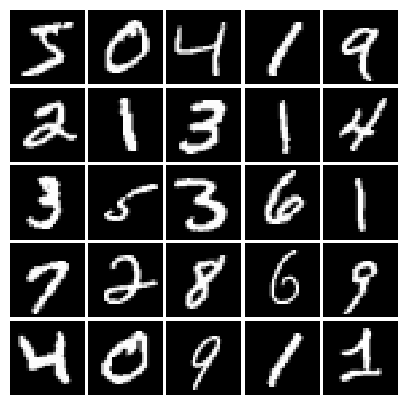

In [ ]:
# show a batch
mnist = MNIST(batch_size=25)

show_images(mnist.X[:25])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [ ]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [ ]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [ ]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [ ]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [ ]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [ ]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [ ]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [ ]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [ ]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [ ]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)

    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [ ]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 1.267, G:0.7128


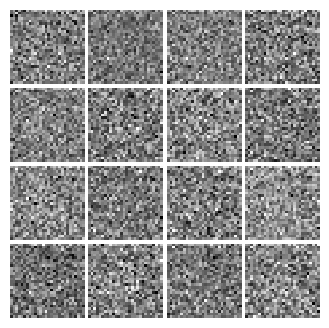

Epoch: 0, Iter: 20, D: 0.5792, G:0.9852


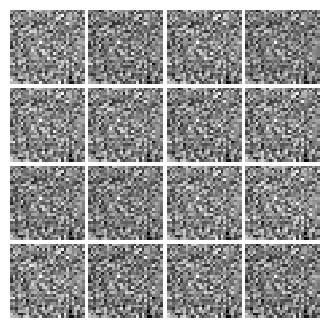

Epoch: 0, Iter: 40, D: 0.4431, G:1.188


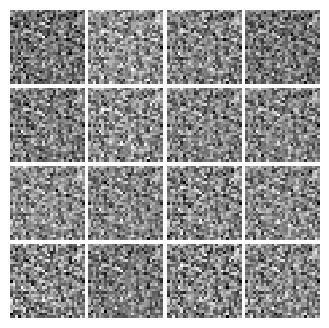

Epoch: 0, Iter: 60, D: 3.012, G:3.184


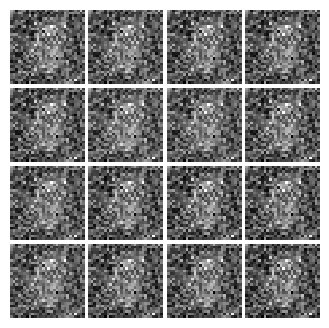

Epoch: 0, Iter: 80, D: 1.442, G:0.9612


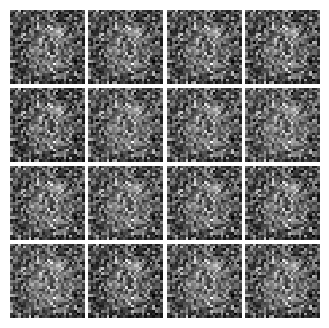

Epoch: 0, Iter: 100, D: 1.098, G:1.833


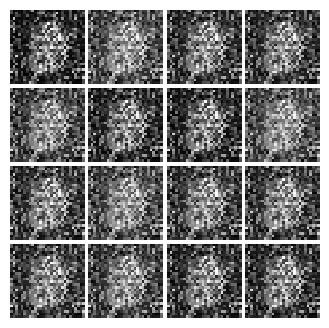

Epoch: 0, Iter: 120, D: 1.049, G:2.068


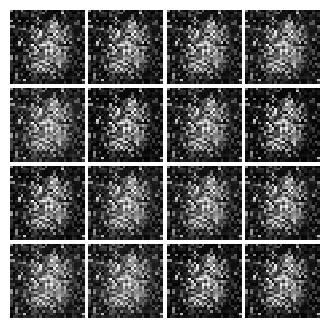

Epoch: 0, Iter: 140, D: 0.9532, G:1.431


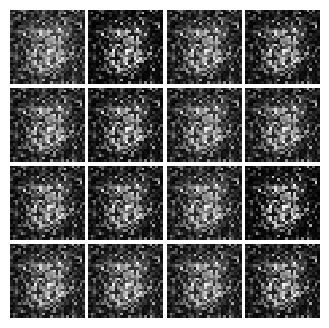

Epoch: 0, Iter: 160, D: 2.172, G:0.3282


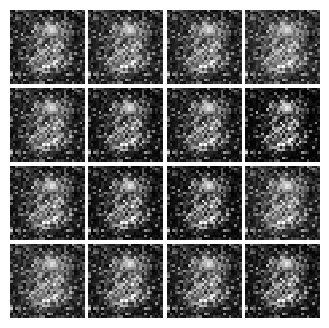

Epoch: 0, Iter: 180, D: 1.037, G:1.392


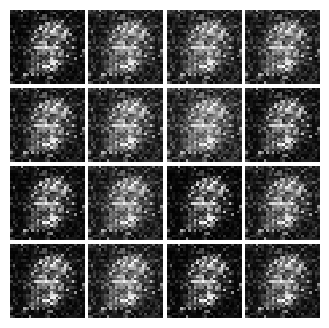

Epoch: 0, Iter: 200, D: 1.515, G:1.273


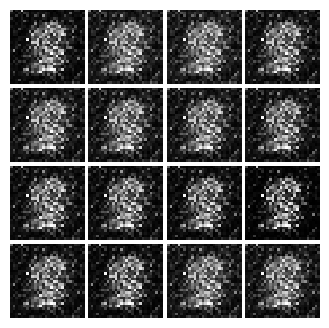

Epoch: 0, Iter: 220, D: 0.5978, G:1.699


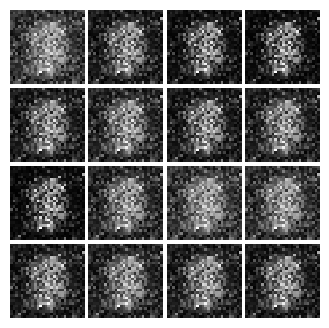

Epoch: 0, Iter: 240, D: 1.75, G:1.578


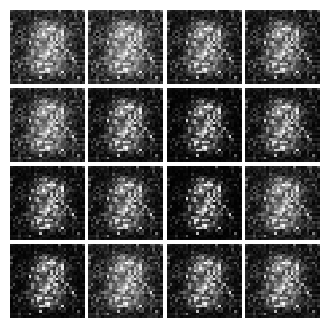

Epoch: 0, Iter: 260, D: 0.638, G:1.78


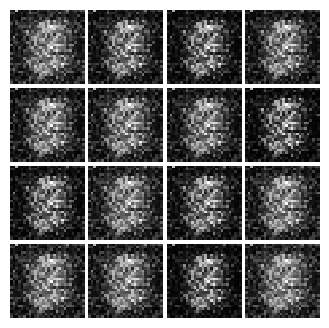

Epoch: 0, Iter: 280, D: 1.443, G:1.021


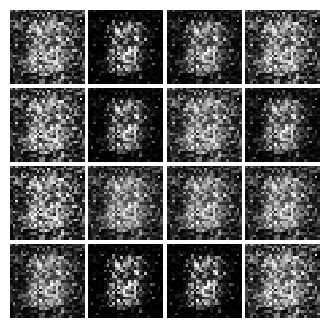

Epoch: 0, Iter: 300, D: 1.347, G:1.29


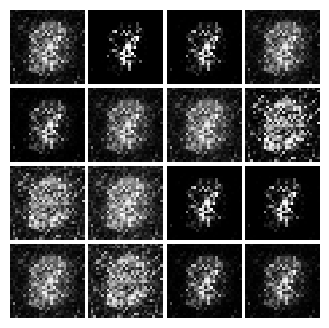

Epoch: 0, Iter: 320, D: 1.034, G:1.124


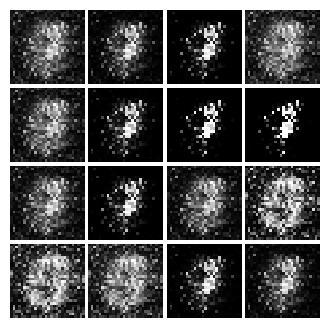

Epoch: 0, Iter: 340, D: 1.129, G:0.9981


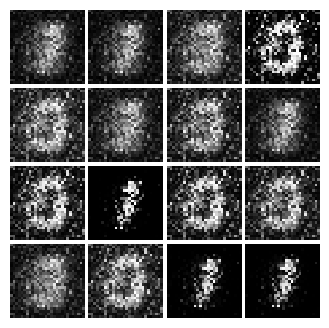

Epoch: 0, Iter: 360, D: 1.412, G:2.562


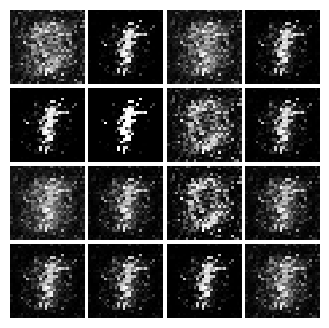

Epoch: 0, Iter: 380, D: 1.266, G:1.204


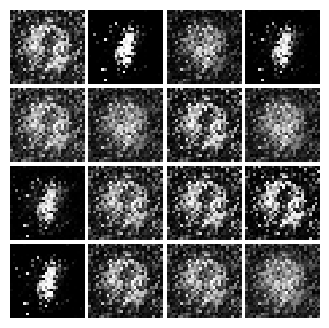

Epoch: 0, Iter: 400, D: 0.8566, G:1.682


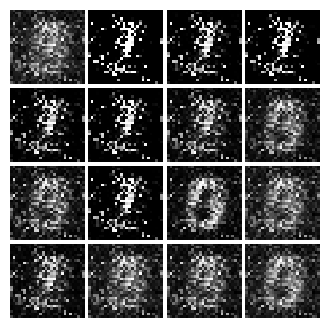

Epoch: 0, Iter: 420, D: 0.915, G:2.919


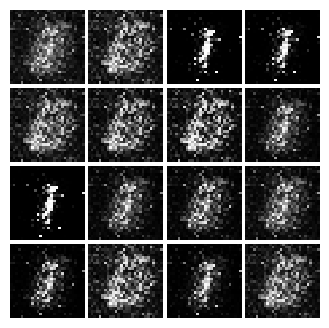

Epoch: 0, Iter: 440, D: 0.7597, G:2.021


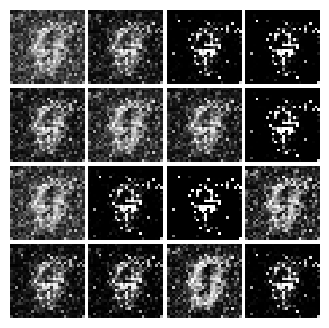

Epoch: 0, Iter: 460, D: 0.9097, G:2.023


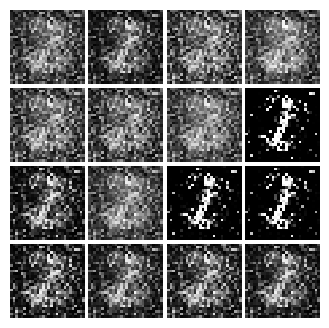

Epoch: 1, Iter: 480, D: 1.411, G:1.051


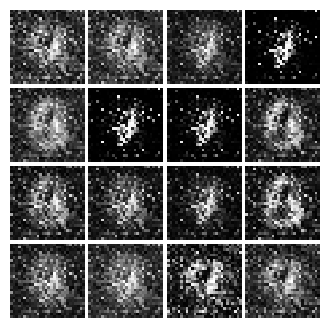

Epoch: 1, Iter: 500, D: 1.109, G:1.791


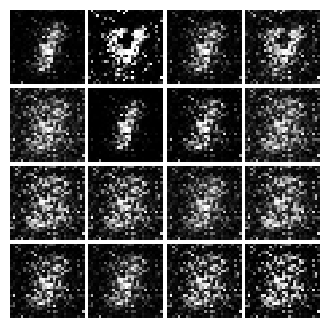

Epoch: 1, Iter: 520, D: 0.9739, G:1.505


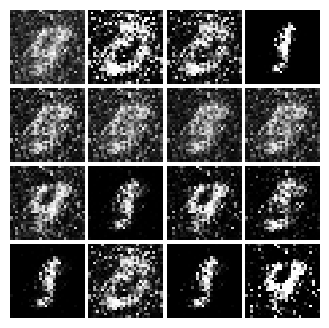

Epoch: 1, Iter: 540, D: 1.048, G:1.524


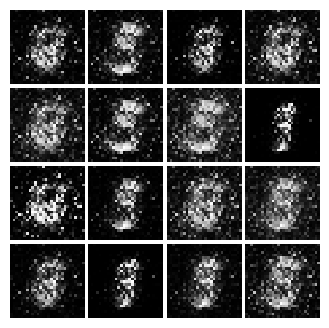

Epoch: 1, Iter: 560, D: 0.9074, G:1.163


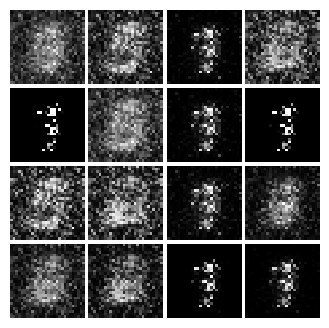

Epoch: 1, Iter: 580, D: 0.899, G:1.828


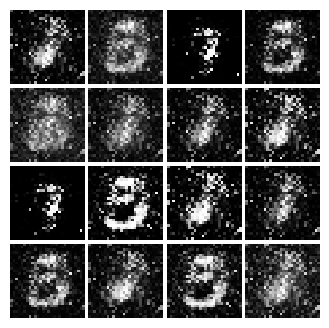

Epoch: 1, Iter: 600, D: 1.126, G:0.947


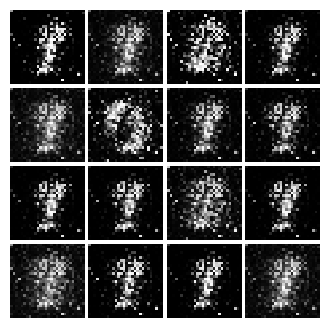

Epoch: 1, Iter: 620, D: 1.02, G:1.506


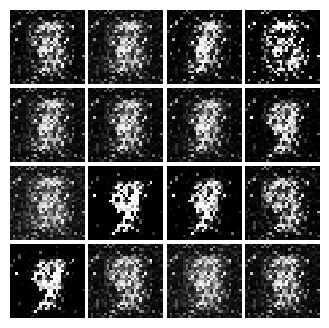

Epoch: 1, Iter: 640, D: 0.5303, G:2.454


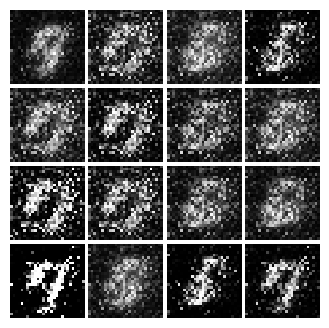

Epoch: 1, Iter: 660, D: 1.288, G:1.509


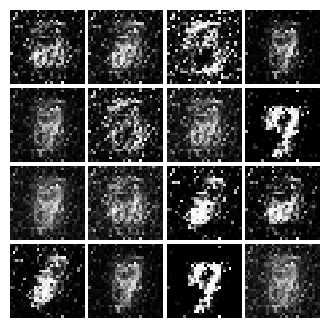

Epoch: 1, Iter: 680, D: 1.075, G:1.17


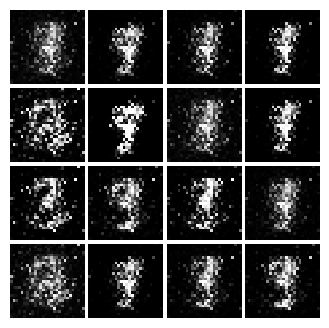

Epoch: 1, Iter: 700, D: 1.208, G:1.662


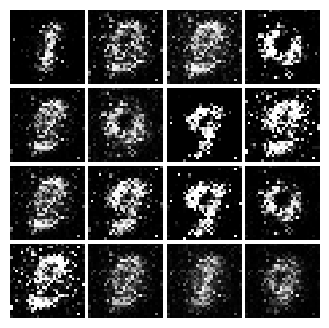

Epoch: 1, Iter: 720, D: 1.244, G:2.001


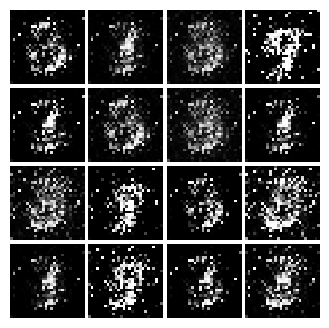

Epoch: 1, Iter: 740, D: 1.127, G:1.098


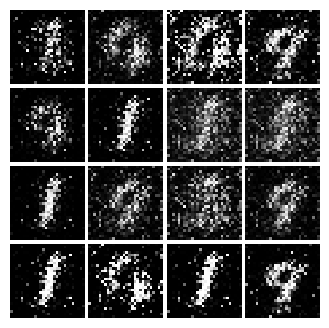

Epoch: 1, Iter: 760, D: 1.248, G:1.513


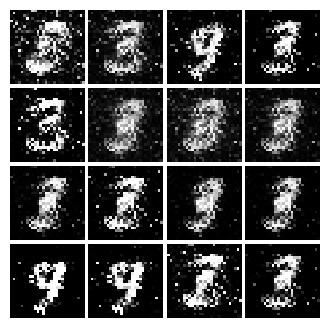

Epoch: 1, Iter: 780, D: 1.346, G:1.132


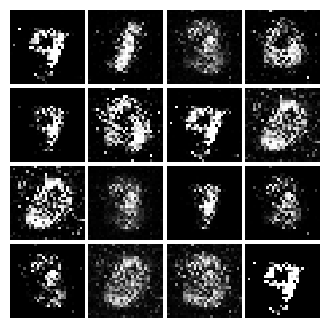

Epoch: 1, Iter: 800, D: 1.196, G:1.33


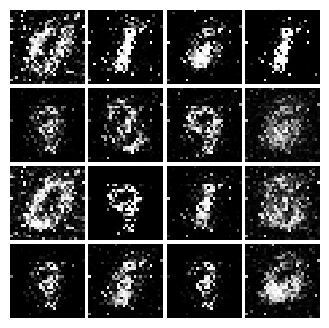

Epoch: 1, Iter: 820, D: 1.028, G:1.212


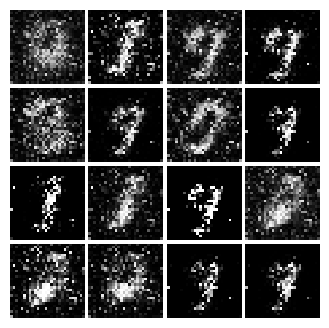

Epoch: 1, Iter: 840, D: 0.9739, G:0.6456


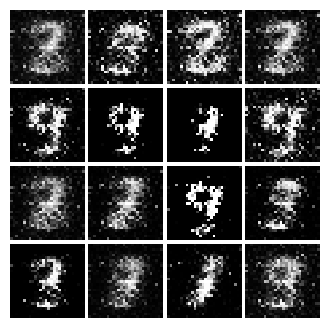

Epoch: 1, Iter: 860, D: 1.279, G:1.764


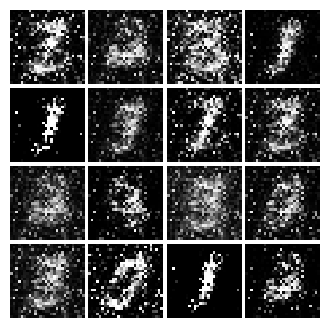

Epoch: 1, Iter: 880, D: 1.085, G:0.8649


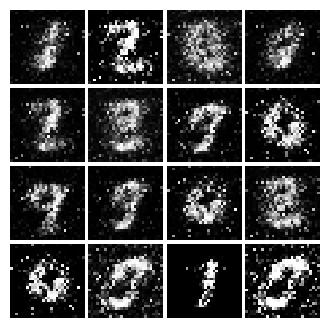

Epoch: 1, Iter: 900, D: 1.081, G:1.505


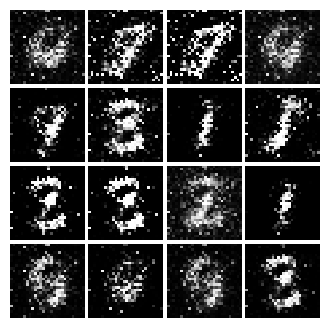

Epoch: 1, Iter: 920, D: 1.487, G:2.736


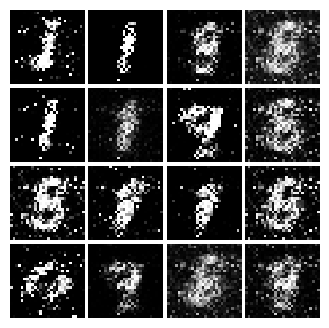

Epoch: 2, Iter: 940, D: 1.156, G:1.487


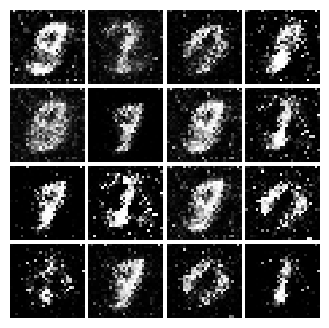

Epoch: 2, Iter: 960, D: 1.069, G:2.908


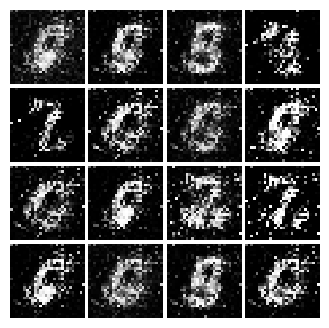

Epoch: 2, Iter: 980, D: 1.059, G:2.873


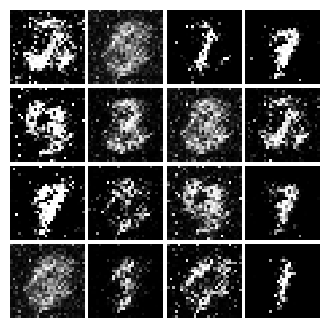

Epoch: 2, Iter: 1000, D: 1.051, G:1.246


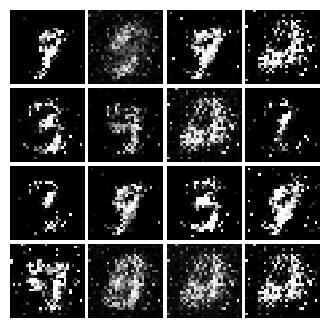

Epoch: 2, Iter: 1020, D: 0.9044, G:1.284


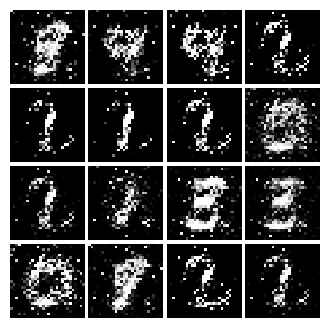

Epoch: 2, Iter: 1040, D: 1.034, G:0.303


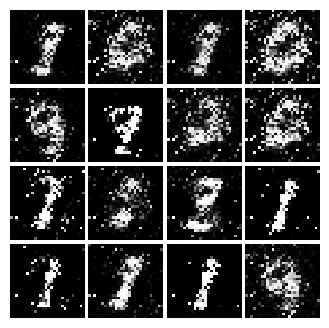

Epoch: 2, Iter: 1060, D: 1.03, G:1.268


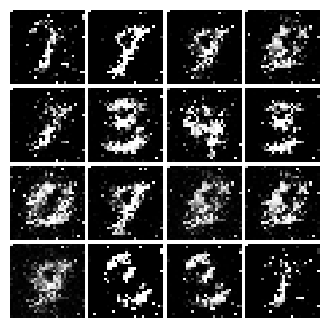

Epoch: 2, Iter: 1080, D: 1.09, G:1.266


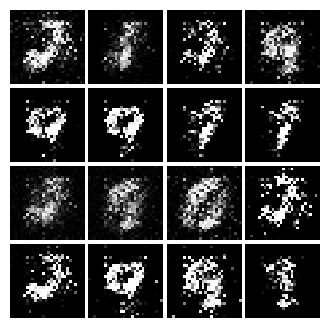

Epoch: 2, Iter: 1100, D: 1.055, G:1.727


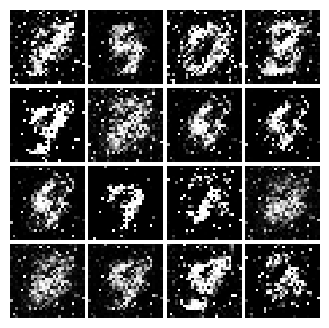

Epoch: 2, Iter: 1120, D: 1.128, G:1.294


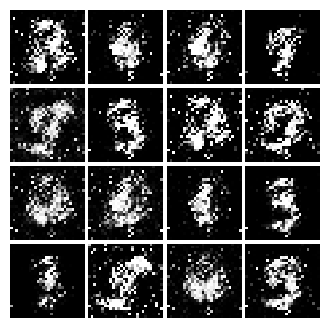

Epoch: 2, Iter: 1140, D: 1.147, G:1.589


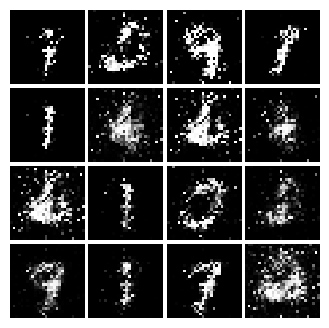

Epoch: 2, Iter: 1160, D: 1.105, G:1.585


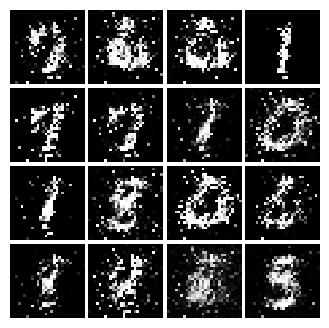

Epoch: 2, Iter: 1180, D: 1.306, G:1.264


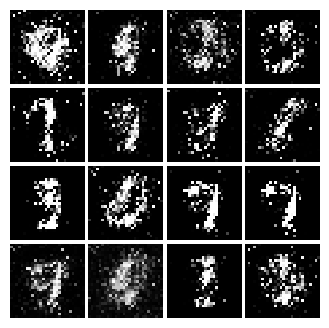

Epoch: 2, Iter: 1200, D: 1.201, G:1.021


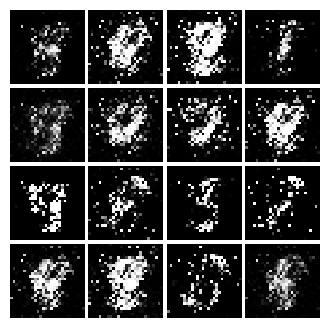

Epoch: 2, Iter: 1220, D: 0.9692, G:1.744


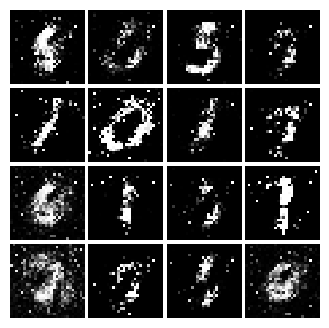

Epoch: 2, Iter: 1240, D: 1.095, G:1.075


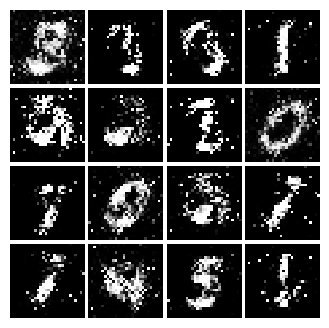

Epoch: 2, Iter: 1260, D: 1.42, G:1.691


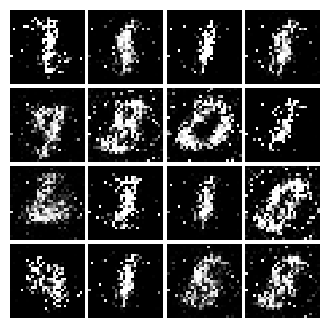

Epoch: 2, Iter: 1280, D: 1.052, G:1.402


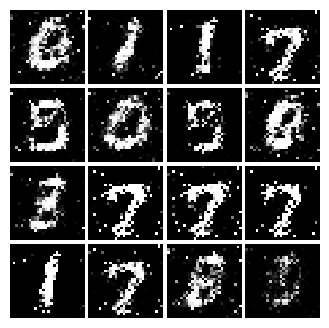

Epoch: 2, Iter: 1300, D: 0.9806, G:1.461


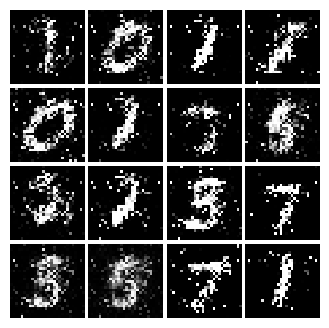

Epoch: 2, Iter: 1320, D: 1.18, G:1.265


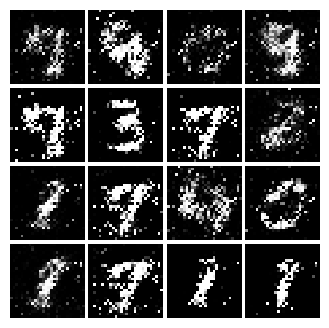

Epoch: 2, Iter: 1340, D: 1.013, G:1.299


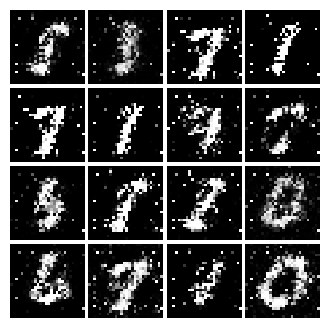

Epoch: 2, Iter: 1360, D: 1.083, G:1.3


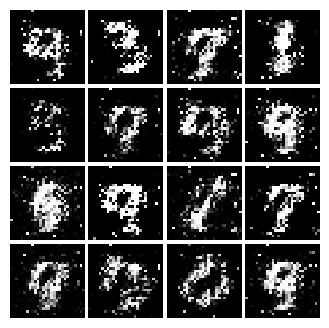

Epoch: 2, Iter: 1380, D: 2.049, G:0.6763


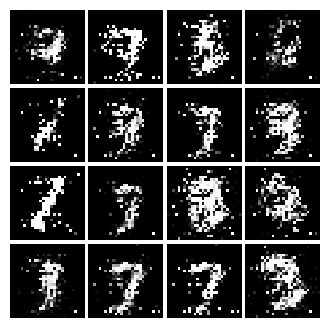

Epoch: 2, Iter: 1400, D: 1.084, G:1.044


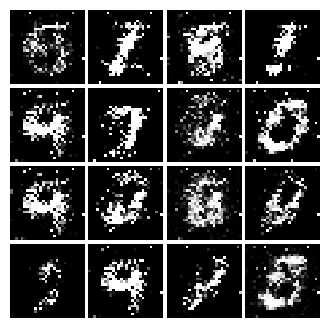

Epoch: 3, Iter: 1420, D: 1.169, G:1.065


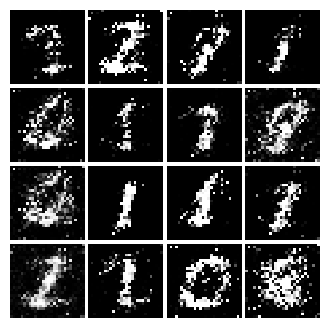

Epoch: 3, Iter: 1440, D: 1.216, G:1.772


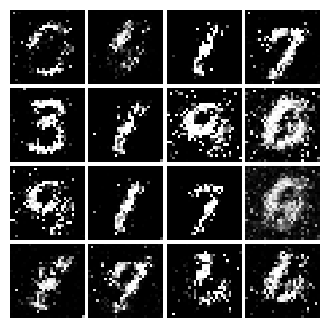

Epoch: 3, Iter: 1460, D: 1.108, G:1.484


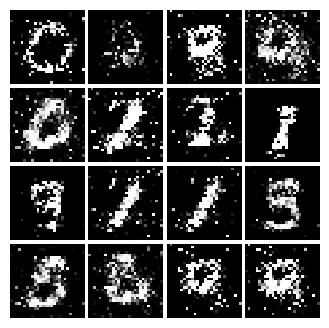

Epoch: 3, Iter: 1480, D: 1.188, G:0.9307


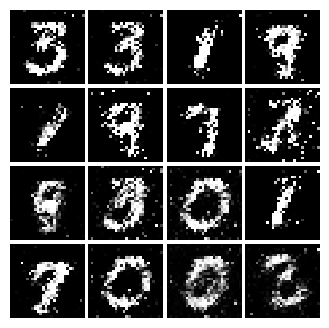

Epoch: 3, Iter: 1500, D: 1.325, G:0.9142


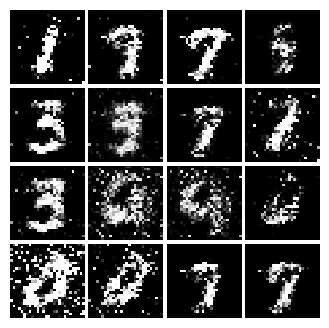

Epoch: 3, Iter: 1520, D: 1.583, G:1.713


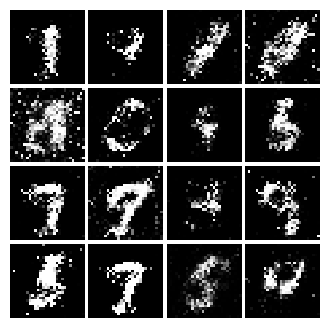

Epoch: 3, Iter: 1540, D: 1.289, G:1.098


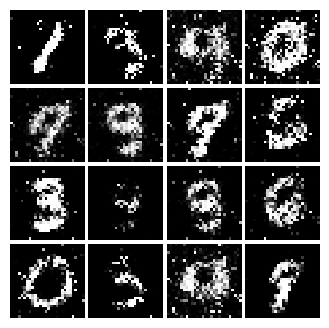

Epoch: 3, Iter: 1560, D: 1.22, G:0.915


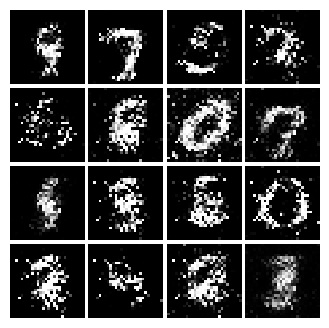

Epoch: 3, Iter: 1580, D: 1.402, G:0.9609


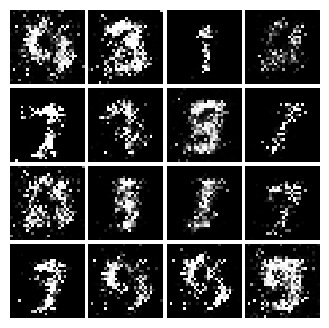

Epoch: 3, Iter: 1600, D: 1.238, G:0.9315


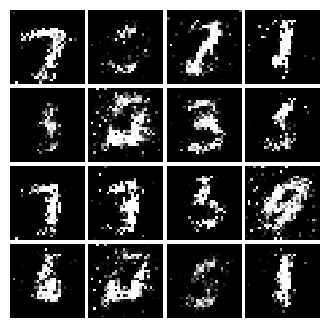

Epoch: 3, Iter: 1620, D: 2.08, G:1.148


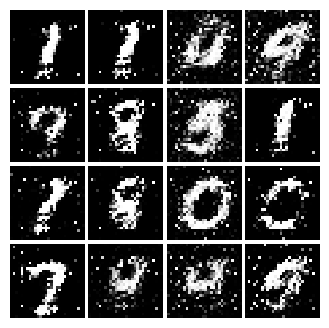

Epoch: 3, Iter: 1640, D: 1.357, G:0.9156


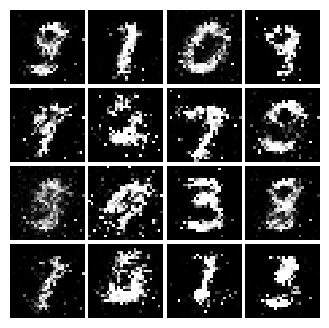

Epoch: 3, Iter: 1660, D: 1.125, G:1.086


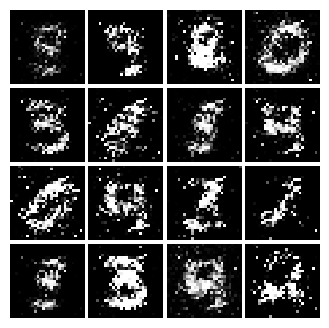

Epoch: 3, Iter: 1680, D: 1.213, G:1.065


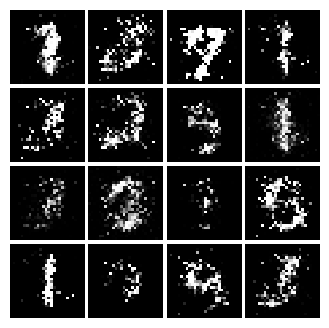

Epoch: 3, Iter: 1700, D: 1.384, G:0.9683


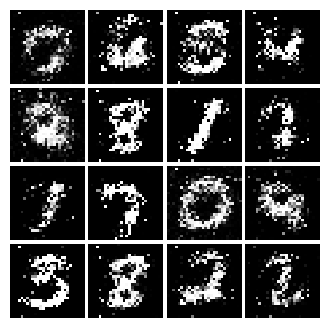

Epoch: 3, Iter: 1720, D: 1.478, G:1.049


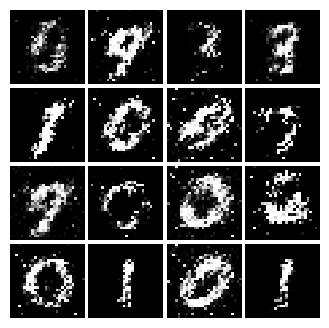

Epoch: 3, Iter: 1740, D: 1.339, G:1.025


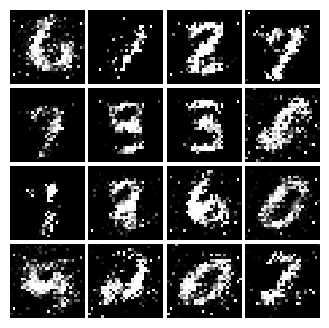

Epoch: 3, Iter: 1760, D: 1.246, G:0.8886


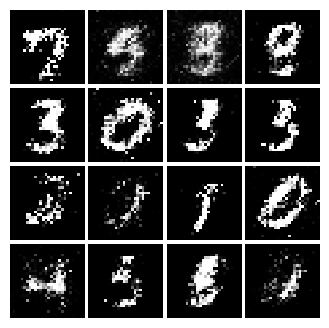

Epoch: 3, Iter: 1780, D: 1.236, G:0.8815


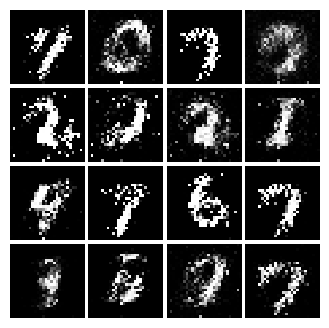

Epoch: 3, Iter: 1800, D: 1.315, G:1.265


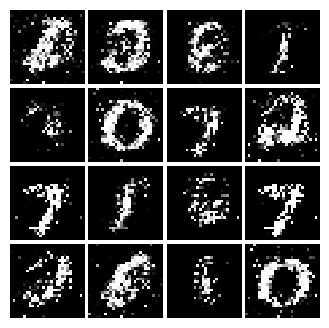

Epoch: 3, Iter: 1820, D: 1.3, G:0.9162


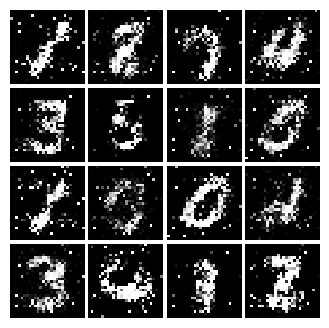

Epoch: 3, Iter: 1840, D: 1.227, G:1.153


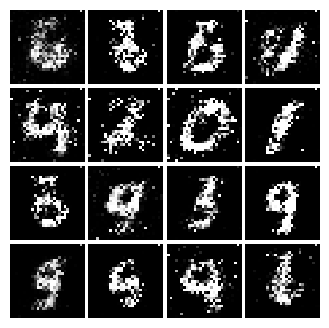

Epoch: 3, Iter: 1860, D: 1.195, G:0.8091


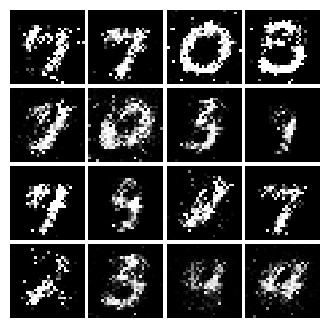

Epoch: 4, Iter: 1880, D: 1.185, G:1.15


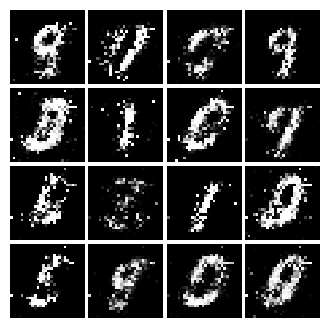

Epoch: 4, Iter: 1900, D: 1.181, G:1.104


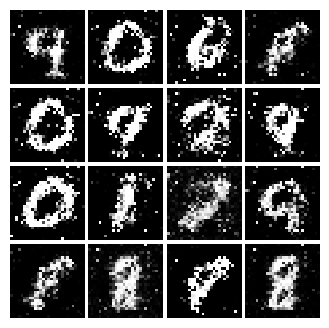

Epoch: 4, Iter: 1920, D: 1.331, G:0.8041


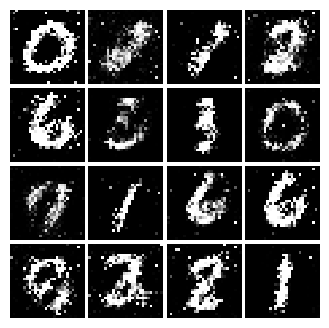

Epoch: 4, Iter: 1940, D: 1.198, G:0.9459


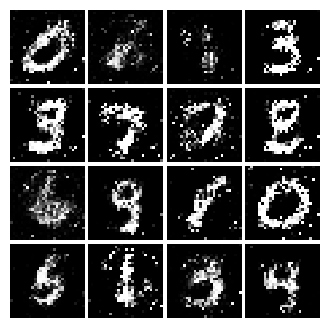

Epoch: 4, Iter: 1960, D: 1.209, G:0.9295


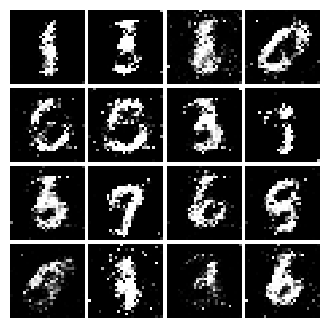

Epoch: 4, Iter: 1980, D: 1.261, G:1.009


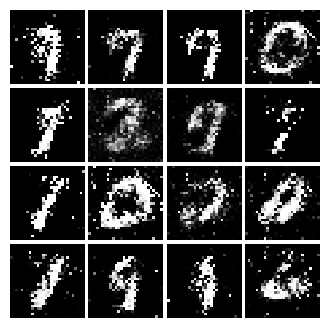

Epoch: 4, Iter: 2000, D: 1.351, G:0.9617


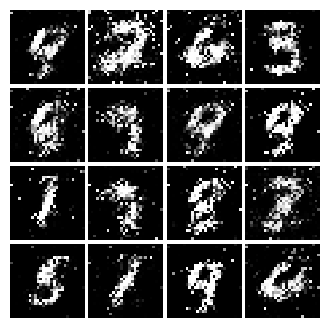

Epoch: 4, Iter: 2020, D: 1.223, G:0.9064


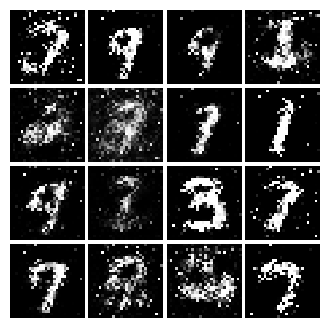

Epoch: 4, Iter: 2040, D: 1.275, G:1.062


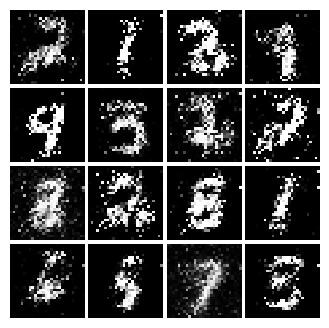

Epoch: 4, Iter: 2060, D: 1.467, G:1.008


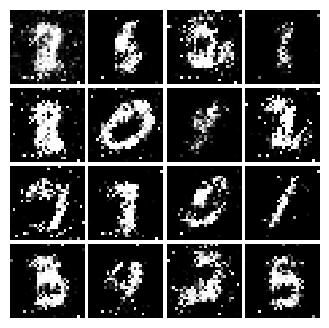

Epoch: 4, Iter: 2080, D: 1.311, G:1.087


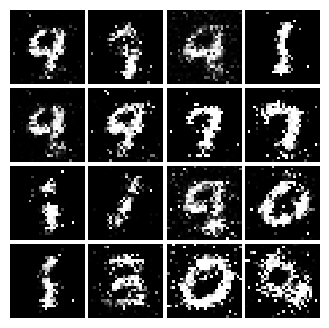

Epoch: 4, Iter: 2100, D: 1.3, G:0.8923


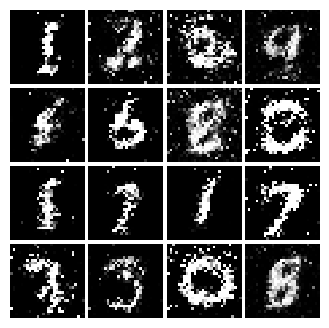

Epoch: 4, Iter: 2120, D: 1.253, G:0.9858


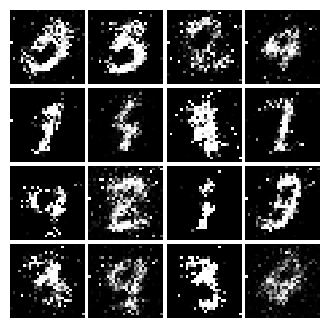

Epoch: 4, Iter: 2140, D: 1.204, G:0.8136


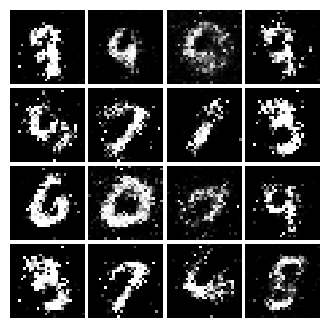

Epoch: 4, Iter: 2160, D: 1.328, G:0.9231


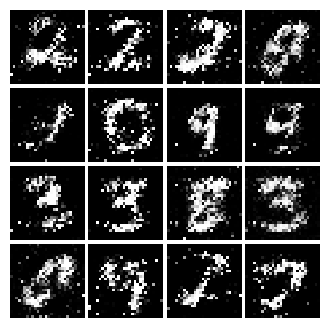

Epoch: 4, Iter: 2180, D: 1.223, G:0.7973


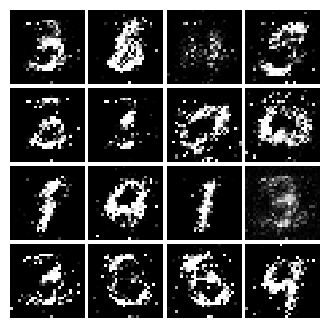

Epoch: 4, Iter: 2200, D: 1.205, G:0.9926


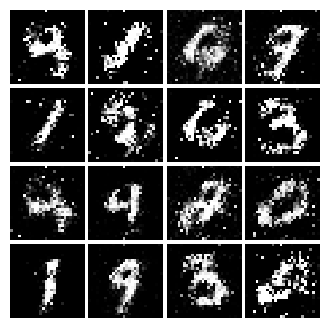

Epoch: 4, Iter: 2220, D: 1.395, G:0.9846


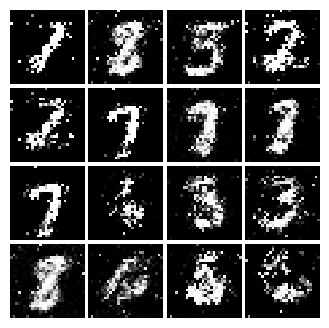

Epoch: 4, Iter: 2240, D: 1.278, G:0.7438


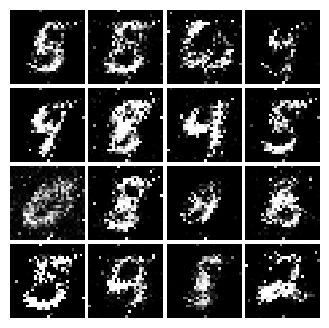

Epoch: 4, Iter: 2260, D: 1.235, G:0.8967


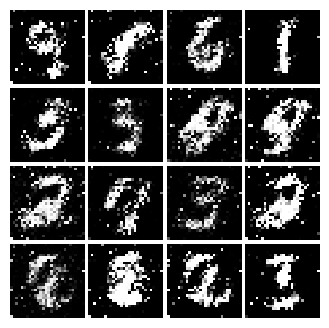

Epoch: 4, Iter: 2280, D: 1.24, G:1.07


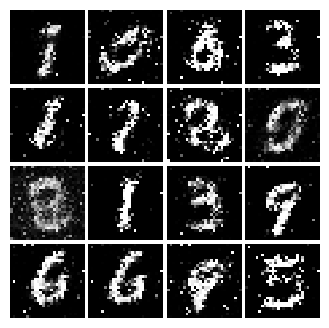

Epoch: 4, Iter: 2300, D: 1.371, G:0.8592


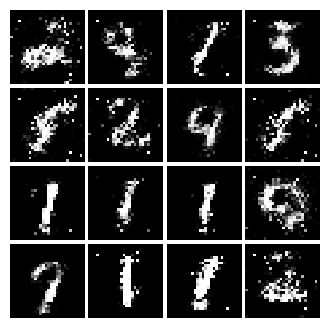

Epoch: 4, Iter: 2320, D: 1.281, G:0.87


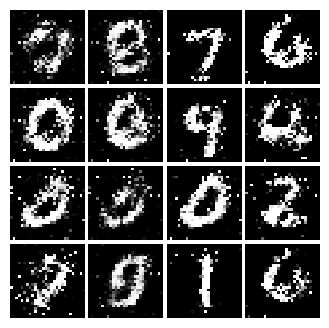

Epoch: 4, Iter: 2340, D: 1.273, G:0.8762


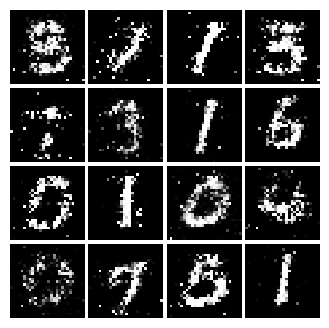

Epoch: 5, Iter: 2360, D: 1.222, G:0.8439


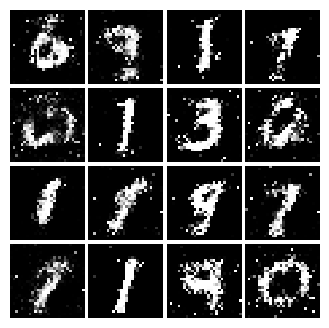

Epoch: 5, Iter: 2380, D: 1.294, G:0.7898


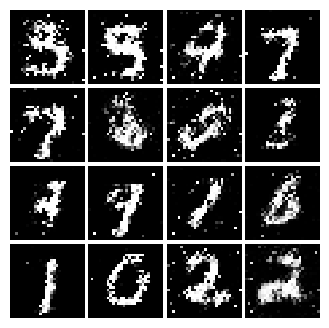

Epoch: 5, Iter: 2400, D: 1.279, G:0.9247


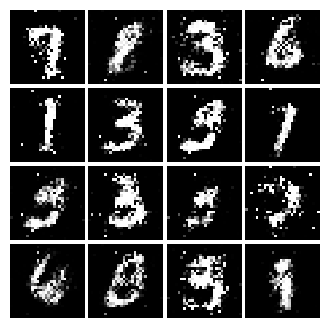

Epoch: 5, Iter: 2420, D: 1.229, G:0.9125


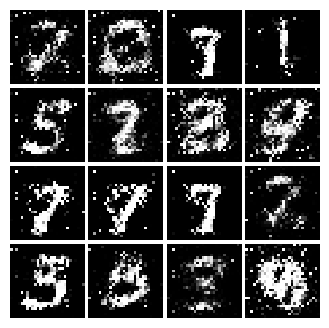

Epoch: 5, Iter: 2440, D: 1.363, G:0.8283


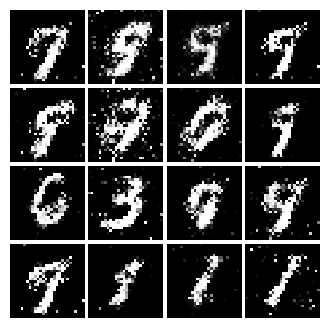

Epoch: 5, Iter: 2460, D: 1.184, G:0.8175


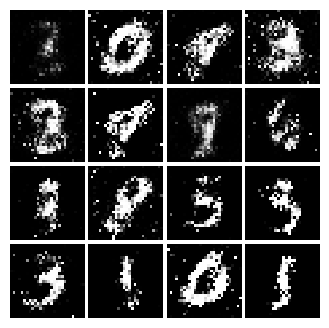

Epoch: 5, Iter: 2480, D: 1.27, G:0.9334


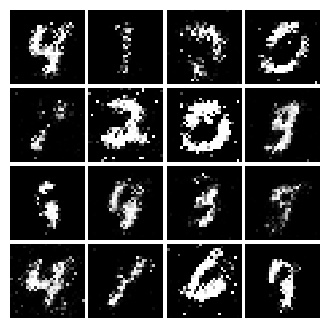

Epoch: 5, Iter: 2500, D: 1.311, G:0.9138


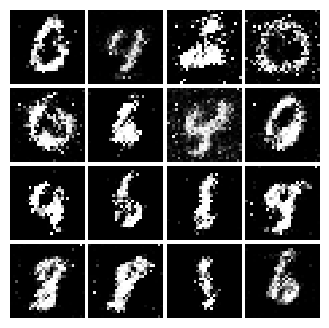

Epoch: 5, Iter: 2520, D: 1.591, G:0.8336


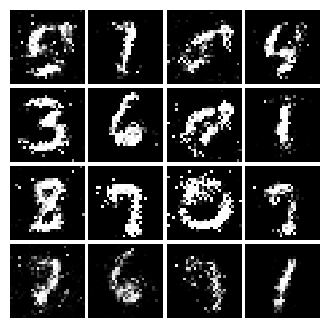

Epoch: 5, Iter: 2540, D: 1.323, G:0.8566


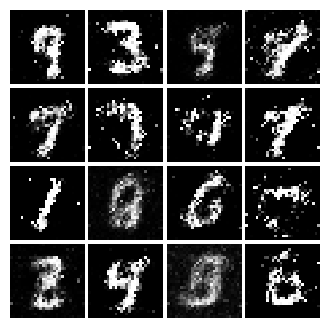

Epoch: 5, Iter: 2560, D: 1.325, G:0.9613


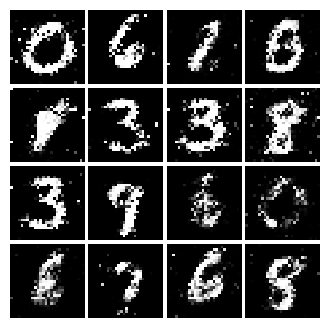

Epoch: 5, Iter: 2580, D: 1.256, G:0.8564


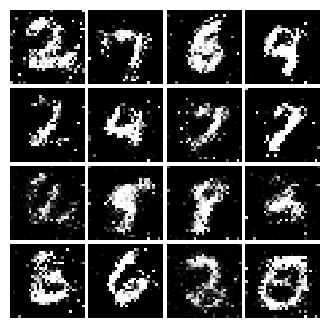

Epoch: 5, Iter: 2600, D: 1.455, G:0.7442


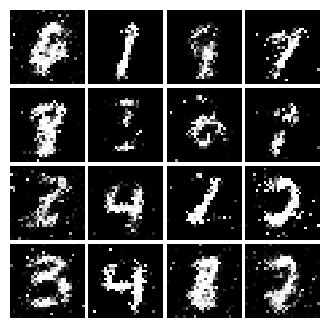

Epoch: 5, Iter: 2620, D: 1.37, G:0.7944


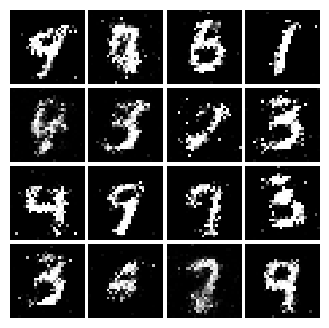

Epoch: 5, Iter: 2640, D: 1.335, G:0.8442


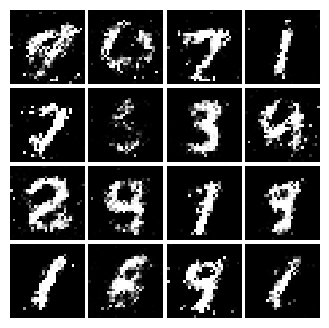

Epoch: 5, Iter: 2660, D: 1.297, G:0.9245


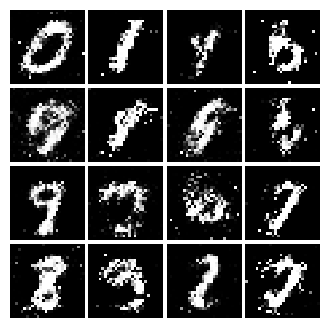

Epoch: 5, Iter: 2680, D: 1.38, G:0.8308


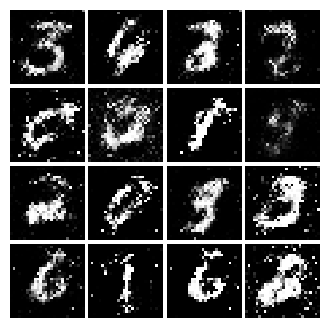

Epoch: 5, Iter: 2700, D: 1.286, G:0.8211


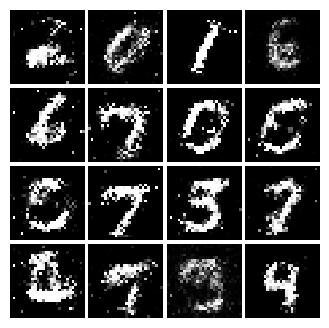

Epoch: 5, Iter: 2720, D: 1.286, G:0.7401


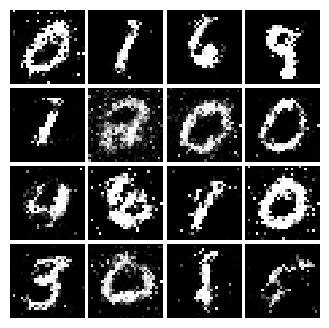

Epoch: 5, Iter: 2740, D: 1.27, G:0.7914


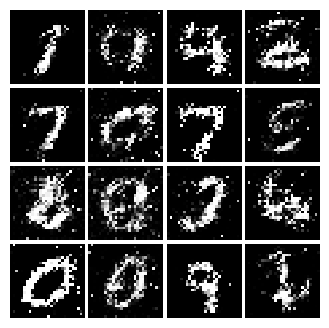

Epoch: 5, Iter: 2760, D: 1.331, G:0.839


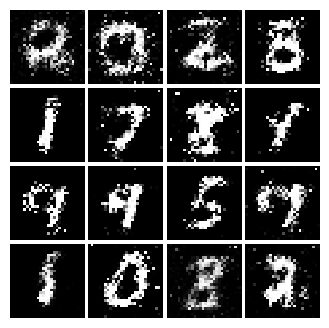

Epoch: 5, Iter: 2780, D: 1.267, G:0.9127


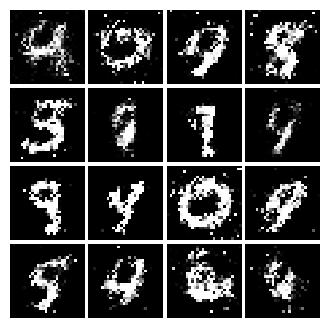

Epoch: 5, Iter: 2800, D: 1.203, G:0.9118


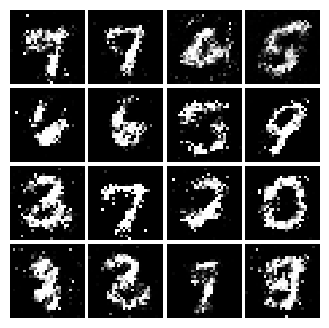

Epoch: 6, Iter: 2820, D: 1.36, G:0.8078


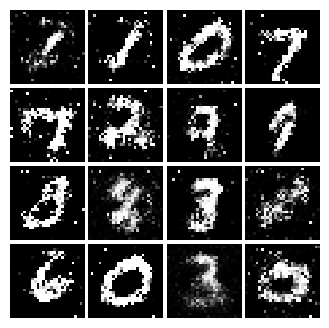

Epoch: 6, Iter: 2840, D: 1.254, G:0.9515


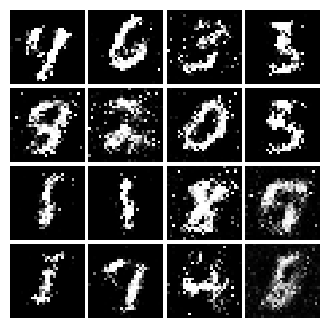

Epoch: 6, Iter: 2860, D: 1.354, G:0.8437


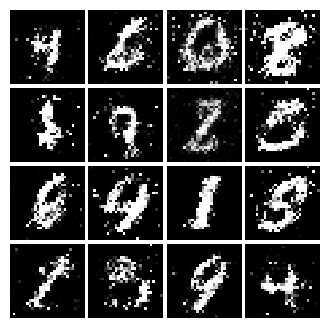

Epoch: 6, Iter: 2880, D: 1.236, G:0.9576


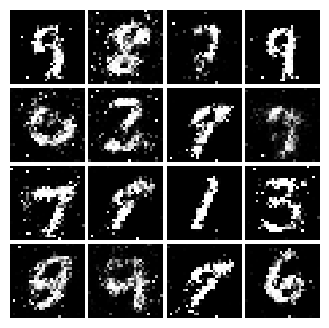

Epoch: 6, Iter: 2900, D: 1.508, G:0.8361


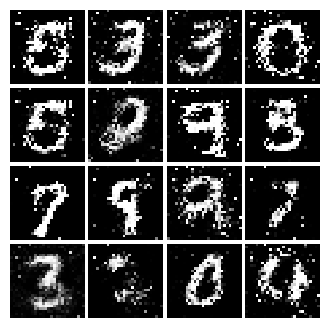

Epoch: 6, Iter: 2920, D: 1.301, G:0.7708


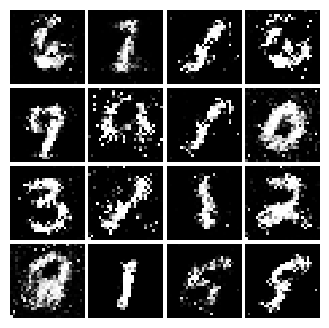

Epoch: 6, Iter: 2940, D: 1.202, G:0.8528


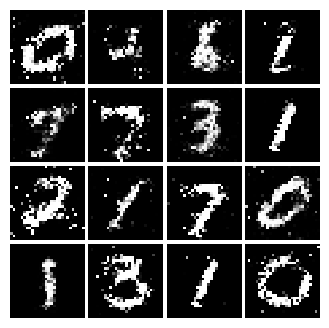

Epoch: 6, Iter: 2960, D: 1.309, G:0.8218


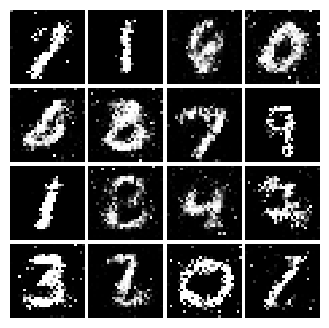

Epoch: 6, Iter: 2980, D: 1.298, G:0.87


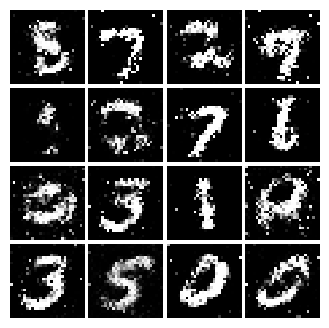

Epoch: 6, Iter: 3000, D: 1.312, G:0.9079


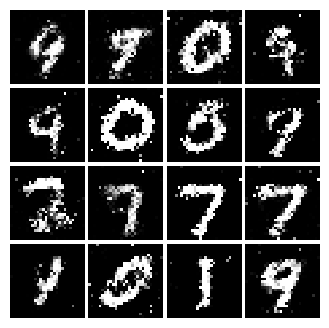

Epoch: 6, Iter: 3020, D: 1.312, G:0.964


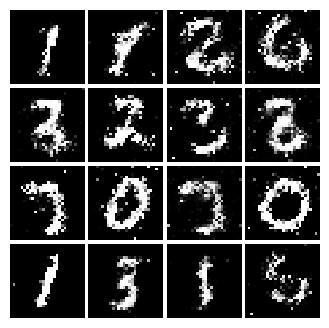

Epoch: 6, Iter: 3040, D: 1.364, G:0.9307


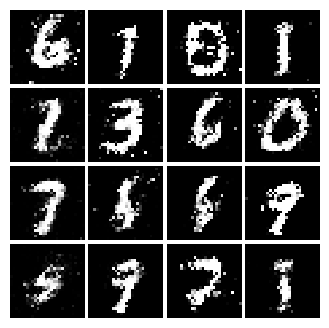

Epoch: 6, Iter: 3060, D: 1.407, G:0.7976


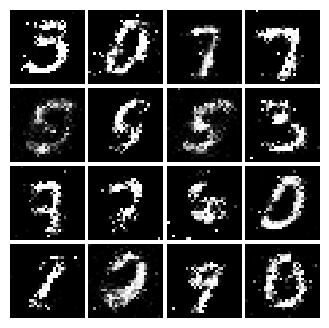

Epoch: 6, Iter: 3080, D: 1.245, G:0.8408


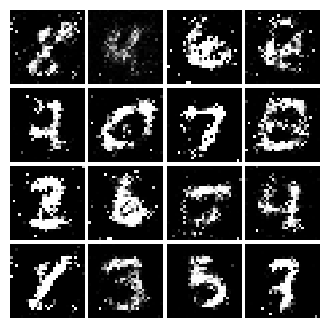

Epoch: 6, Iter: 3100, D: 1.305, G:0.8581


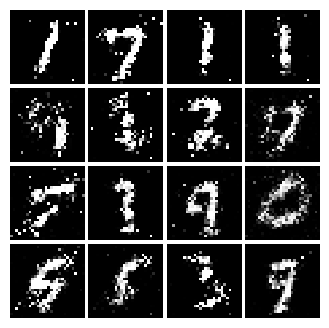

Epoch: 6, Iter: 3120, D: 1.287, G:0.8097


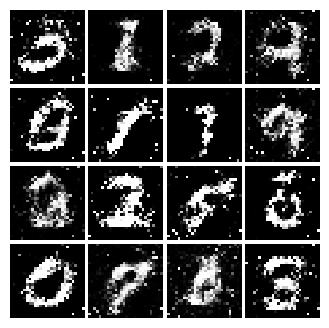

Epoch: 6, Iter: 3140, D: 1.338, G:0.8473


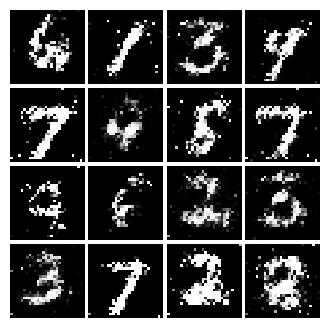

Epoch: 6, Iter: 3160, D: 1.316, G:0.8872


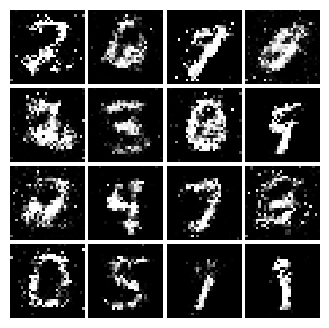

Epoch: 6, Iter: 3180, D: 1.365, G:0.7493


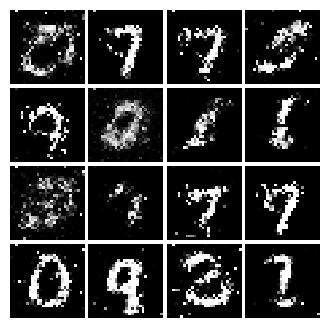

Epoch: 6, Iter: 3200, D: 1.321, G:0.8065


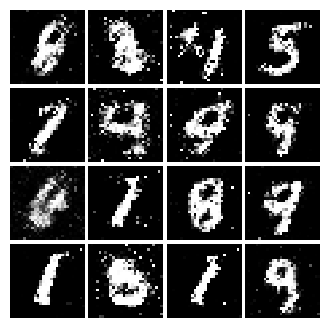

Epoch: 6, Iter: 3220, D: 1.321, G:0.7987


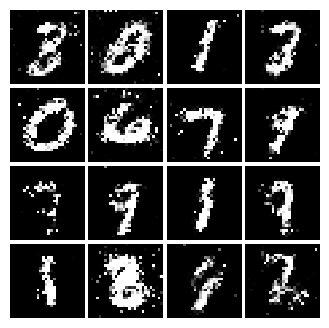

Epoch: 6, Iter: 3240, D: 1.291, G:0.8176


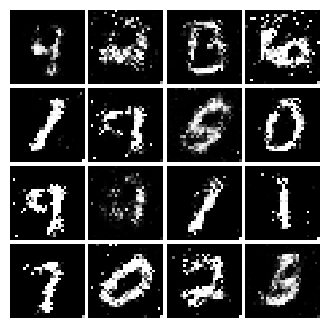

Epoch: 6, Iter: 3260, D: 1.327, G:0.8384


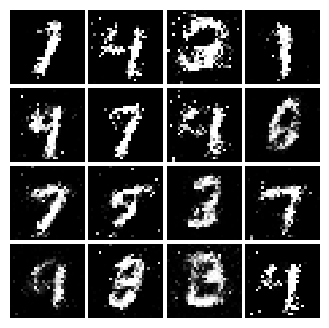

Epoch: 6, Iter: 3280, D: 1.333, G:0.8529


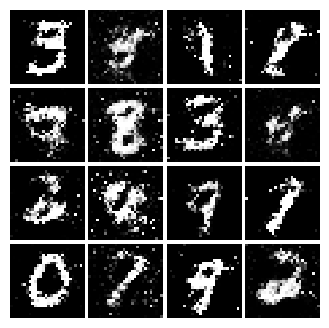

Epoch: 7, Iter: 3300, D: 1.309, G:0.8539


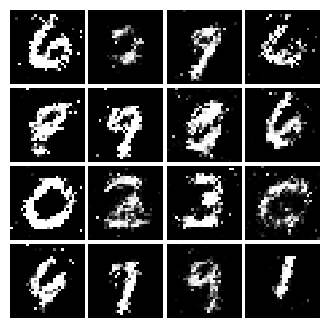

Epoch: 7, Iter: 3320, D: 1.289, G:0.767


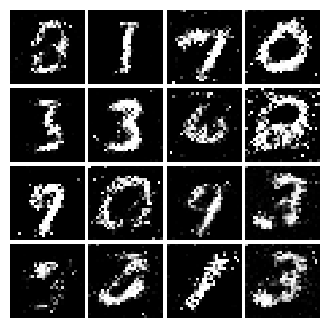

Epoch: 7, Iter: 3340, D: 1.259, G:1.07


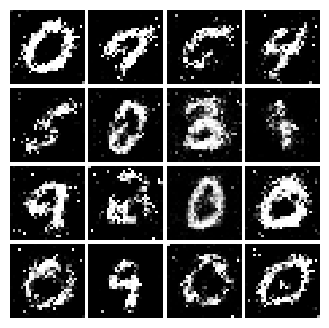

Epoch: 7, Iter: 3360, D: 1.337, G:0.8971


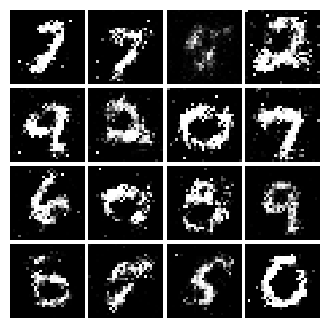

Epoch: 7, Iter: 3380, D: 1.284, G:0.8274


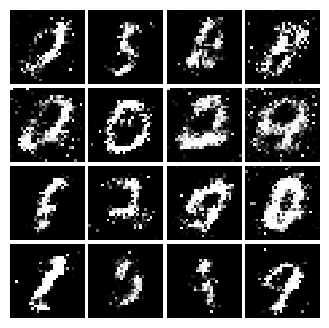

Epoch: 7, Iter: 3400, D: 1.311, G:0.8044


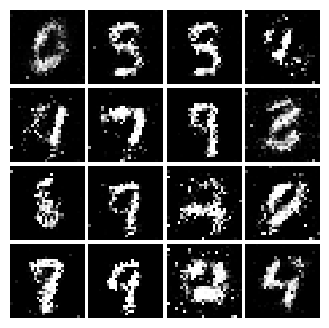

Epoch: 7, Iter: 3420, D: 1.293, G:0.8934


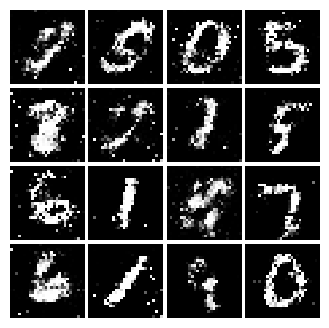

Epoch: 7, Iter: 3440, D: 1.253, G:0.9824


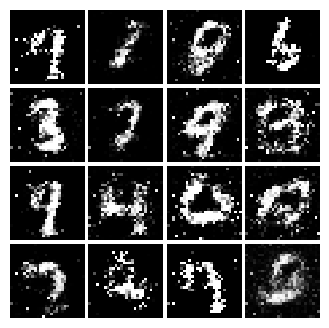

Epoch: 7, Iter: 3460, D: 1.257, G:0.8909


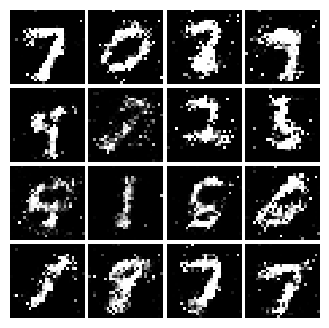

Epoch: 7, Iter: 3480, D: 1.353, G:0.7565


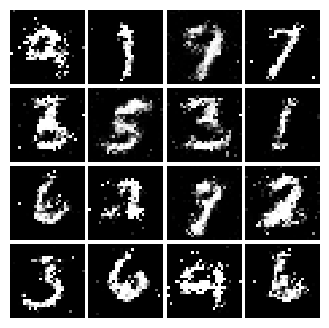

Epoch: 7, Iter: 3500, D: 1.317, G:0.7676


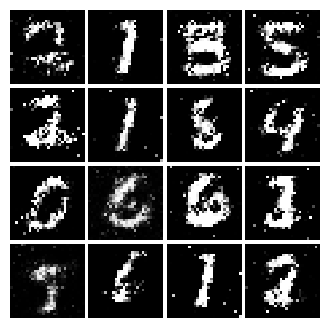

Epoch: 7, Iter: 3520, D: 1.313, G:0.8175


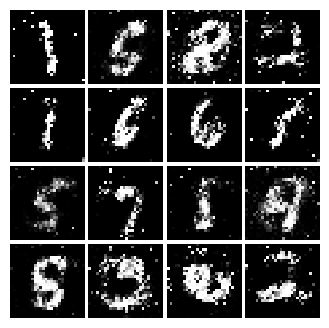

Epoch: 7, Iter: 3540, D: 1.226, G:0.9198


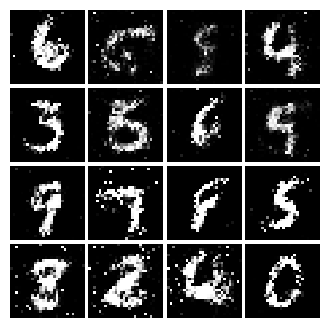

Epoch: 7, Iter: 3560, D: 1.333, G:0.9318


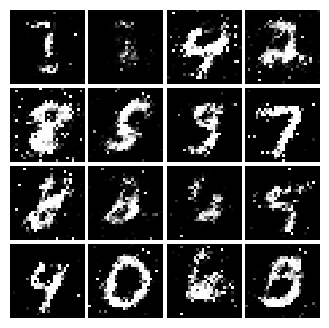

Epoch: 7, Iter: 3580, D: 1.298, G:0.8544


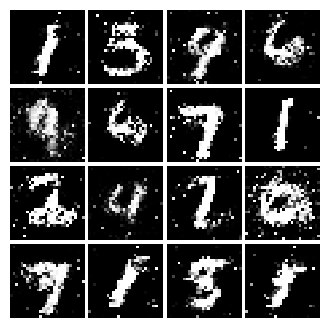

Epoch: 7, Iter: 3600, D: 1.332, G:0.8596


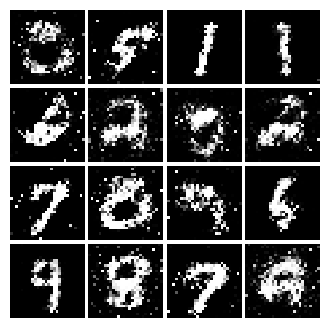

Epoch: 7, Iter: 3620, D: 1.282, G:0.7832


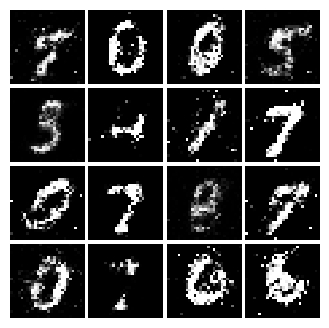

Epoch: 7, Iter: 3640, D: 1.268, G:0.7903


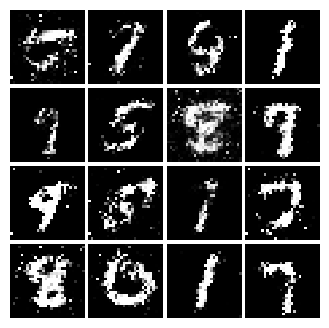

Epoch: 7, Iter: 3660, D: 1.317, G:0.7475


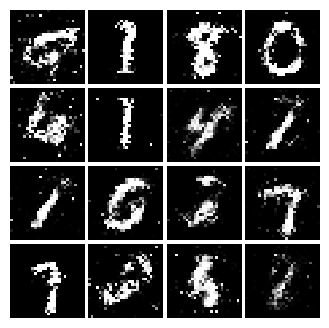

Epoch: 7, Iter: 3680, D: 1.387, G:0.7027


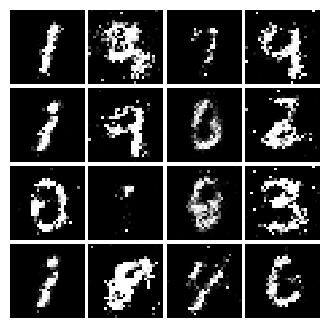

Epoch: 7, Iter: 3700, D: 1.279, G:0.8511


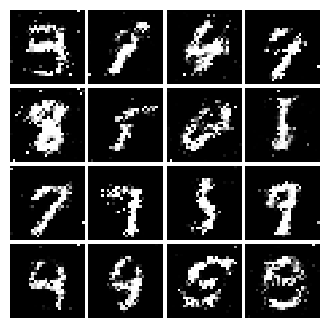

Epoch: 7, Iter: 3720, D: 1.328, G:0.7901


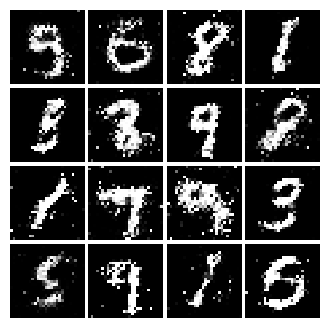

Epoch: 7, Iter: 3740, D: 1.403, G:0.826


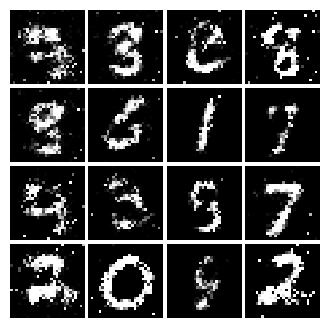

Epoch: 8, Iter: 3760, D: 1.366, G:0.8669


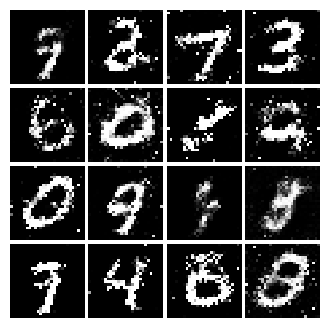

Epoch: 8, Iter: 3780, D: 1.355, G:0.8118


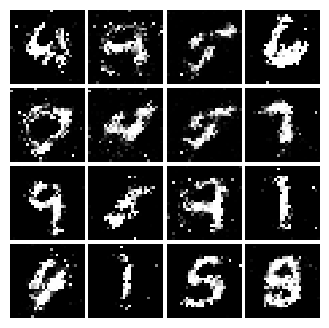

Epoch: 8, Iter: 3800, D: 1.287, G:0.7498


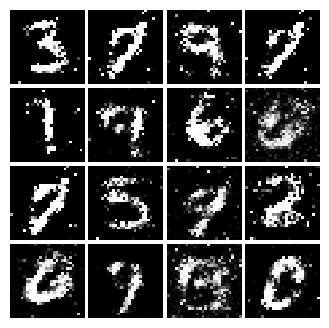

Epoch: 8, Iter: 3820, D: 1.297, G:0.7178


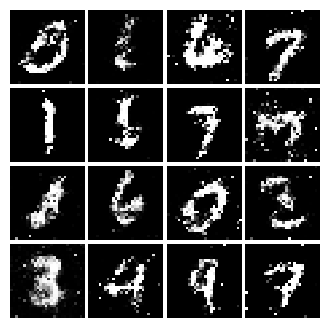

Epoch: 8, Iter: 3840, D: 1.39, G:0.852


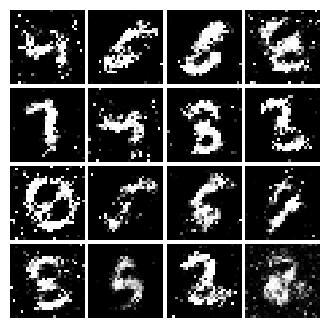

Epoch: 8, Iter: 3860, D: 1.268, G:0.8154


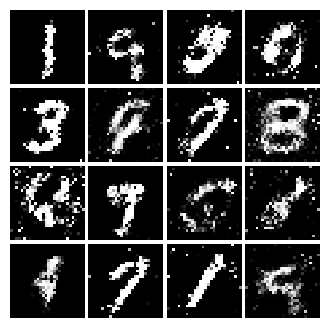

Epoch: 8, Iter: 3880, D: 1.255, G:0.7551


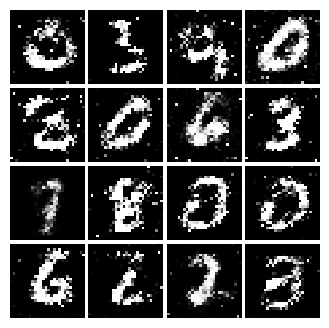

Epoch: 8, Iter: 3900, D: 1.323, G:0.8088


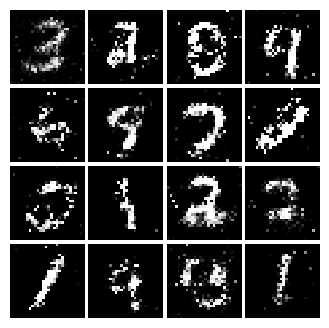

Epoch: 8, Iter: 3920, D: 1.313, G:0.8694


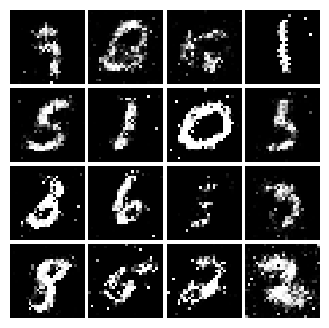

Epoch: 8, Iter: 3940, D: 1.259, G:0.921


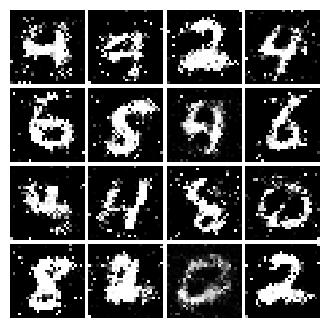

Epoch: 8, Iter: 3960, D: 1.31, G:0.8421


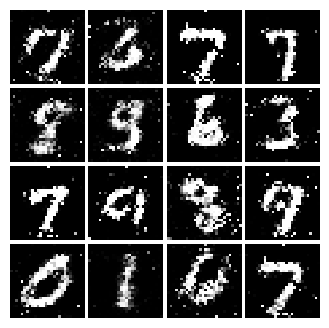

Epoch: 8, Iter: 3980, D: 1.243, G:0.8734


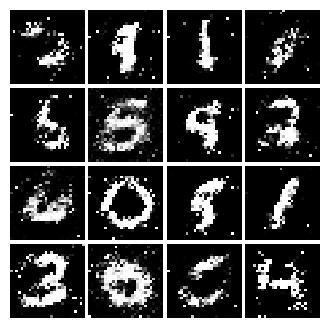

Epoch: 8, Iter: 4000, D: 1.266, G:0.8478


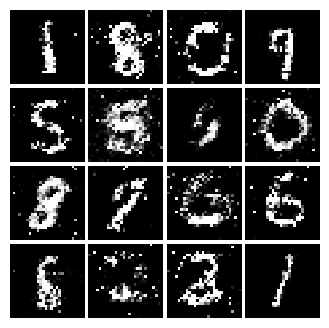

Epoch: 8, Iter: 4020, D: 1.402, G:0.8253


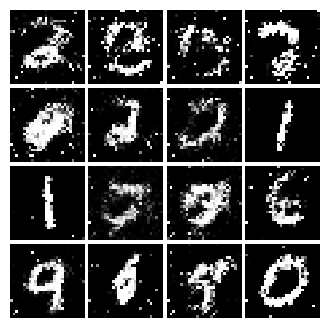

Epoch: 8, Iter: 4040, D: 1.234, G:0.8239


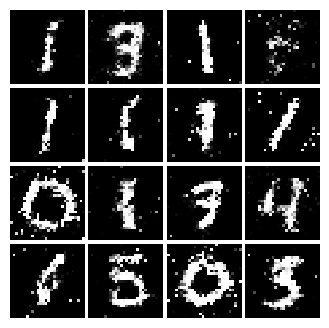

Epoch: 8, Iter: 4060, D: 1.265, G:0.8886


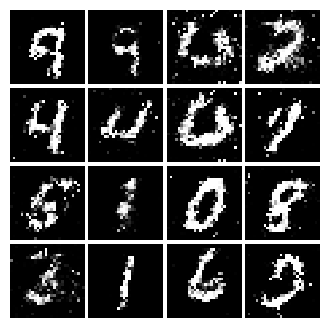

Epoch: 8, Iter: 4080, D: 1.419, G:0.8501


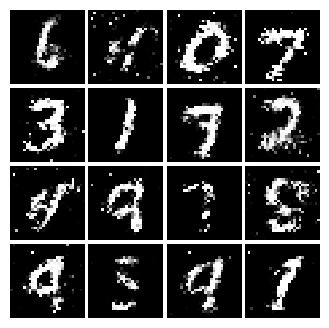

Epoch: 8, Iter: 4100, D: 1.362, G:0.8997


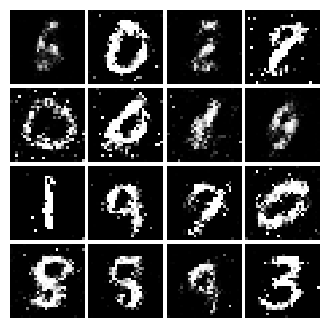

Epoch: 8, Iter: 4120, D: 1.31, G:0.7852


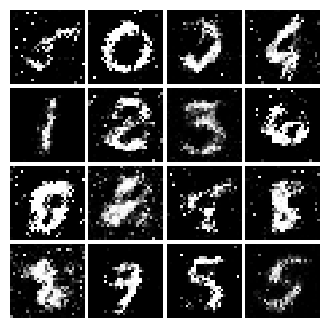

Epoch: 8, Iter: 4140, D: 1.319, G:0.8654


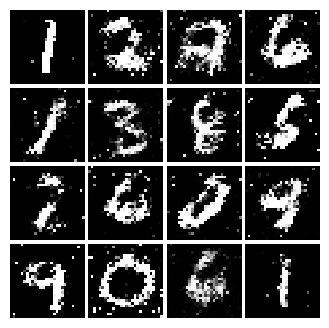

Epoch: 8, Iter: 4160, D: 1.363, G:0.8491


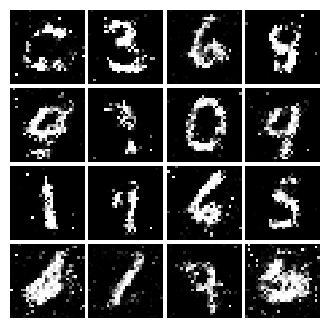

Epoch: 8, Iter: 4180, D: 1.319, G:0.8905


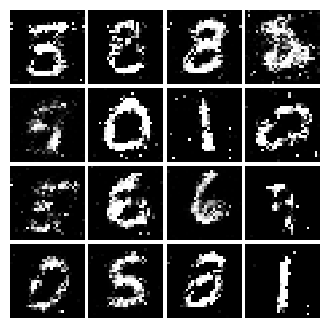

Epoch: 8, Iter: 4200, D: 1.243, G:0.8771


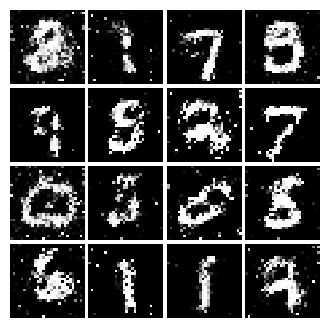

Epoch: 8, Iter: 4220, D: 1.321, G:0.8371


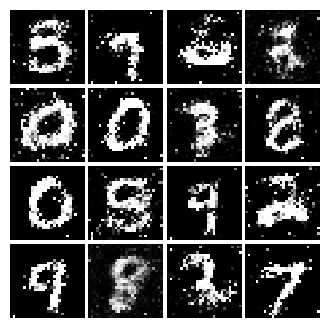

Epoch: 9, Iter: 4240, D: 1.366, G:0.7447


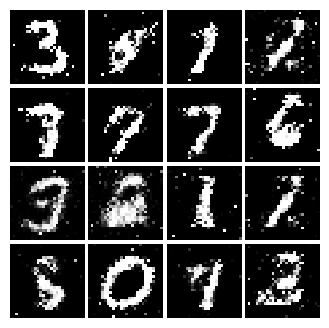

Epoch: 9, Iter: 4260, D: 1.398, G:0.7821


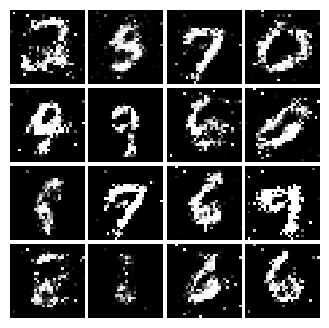

Epoch: 9, Iter: 4280, D: 1.419, G:0.9215


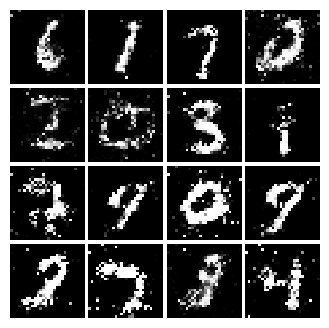

Epoch: 9, Iter: 4300, D: 1.354, G:0.8343


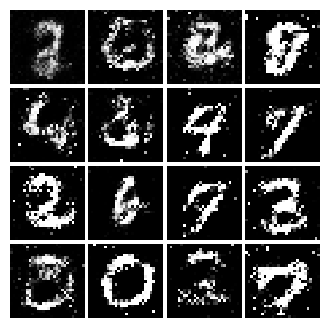

Epoch: 9, Iter: 4320, D: 1.314, G:0.8847


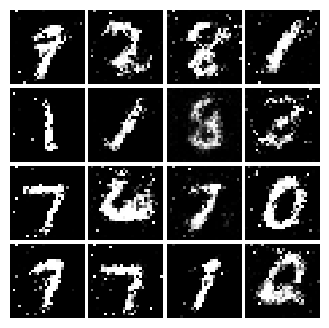

Epoch: 9, Iter: 4340, D: 1.333, G:0.85


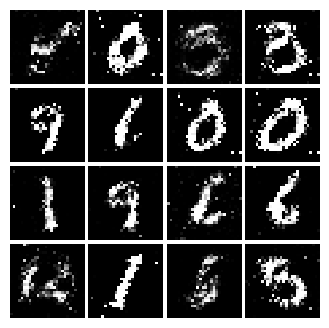

Epoch: 9, Iter: 4360, D: 1.367, G:0.9014


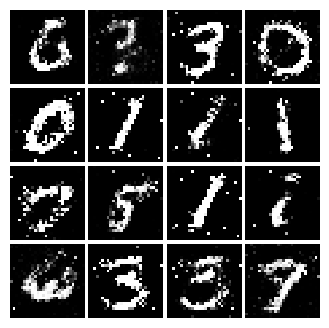

Epoch: 9, Iter: 4380, D: 1.502, G:0.8479


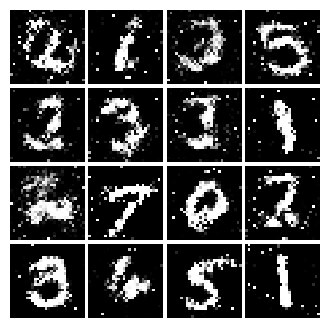

Epoch: 9, Iter: 4400, D: 1.256, G:0.9414


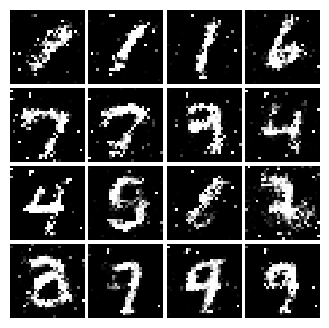

Epoch: 9, Iter: 4420, D: 1.344, G:0.8309


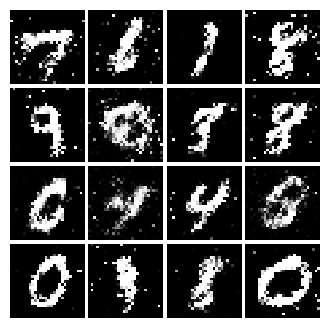

Epoch: 9, Iter: 4440, D: 1.288, G:0.8726


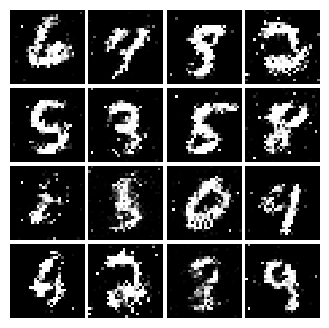

Epoch: 9, Iter: 4460, D: 1.357, G:0.8354


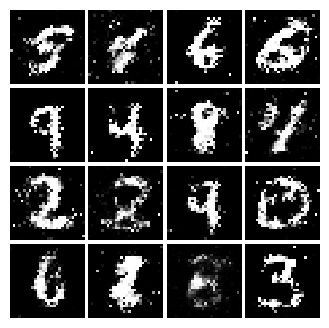

Epoch: 9, Iter: 4480, D: 1.344, G:0.7727


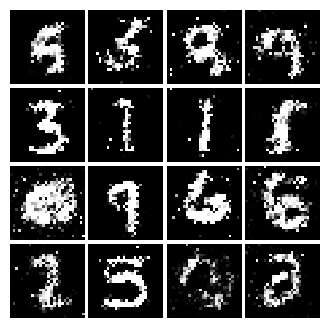

Epoch: 9, Iter: 4500, D: 1.431, G:0.7705


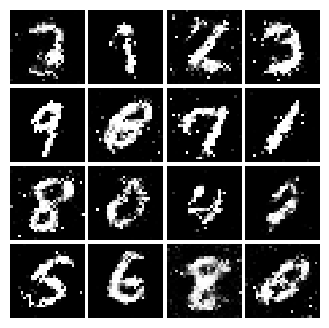

Epoch: 9, Iter: 4520, D: 1.364, G:0.8391


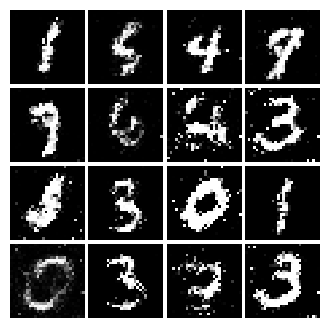

Epoch: 9, Iter: 4540, D: 1.363, G:0.7507


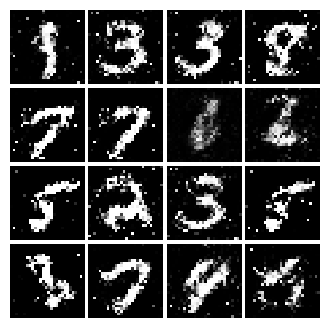

Epoch: 9, Iter: 4560, D: 1.221, G:0.7943


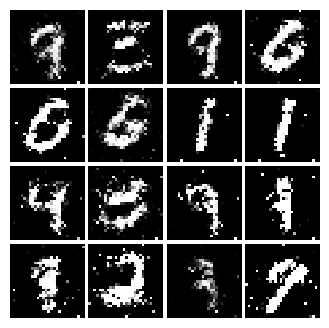

Epoch: 9, Iter: 4580, D: 1.272, G:0.8297


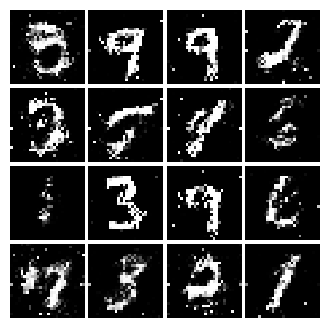

Epoch: 9, Iter: 4600, D: 1.379, G:0.7729


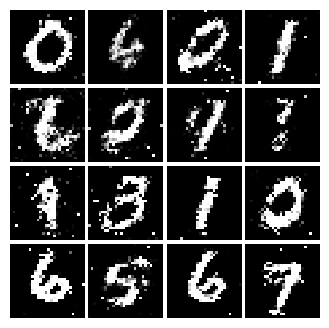

Epoch: 9, Iter: 4620, D: 1.299, G:0.8768


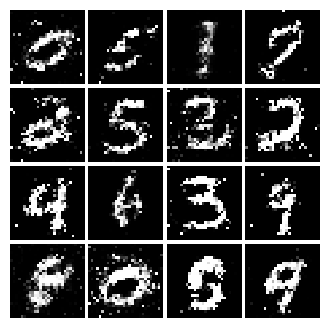

Epoch: 9, Iter: 4640, D: 1.34, G:0.8262


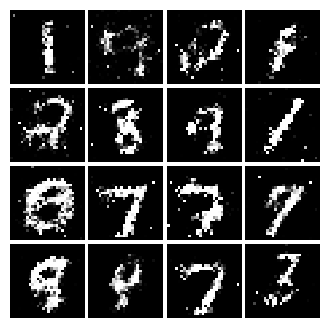

Epoch: 9, Iter: 4660, D: 1.258, G:0.7426


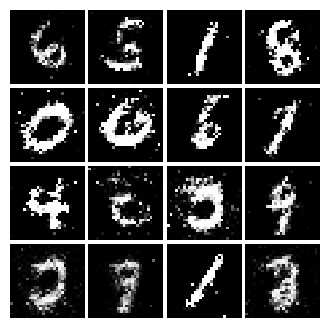

Epoch: 9, Iter: 4680, D: 1.264, G:0.8505


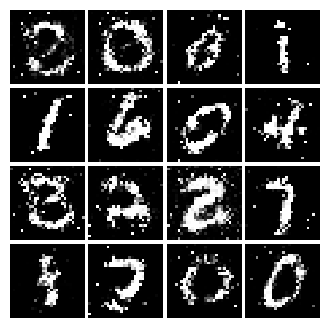

Final images


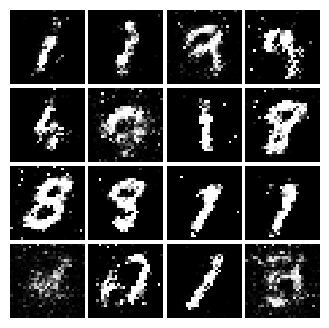

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [ ]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [ ]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.5697, G:0.4126


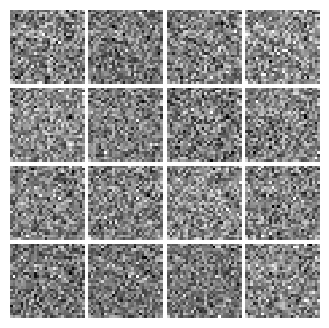

Epoch: 0, Iter: 20, D: 0.1233, G:0.7627


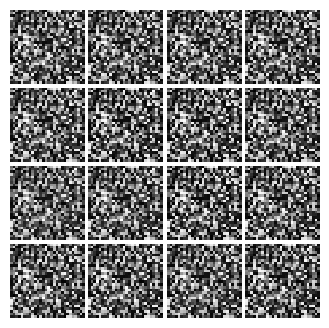

Epoch: 0, Iter: 40, D: 0.0108, G:0.59


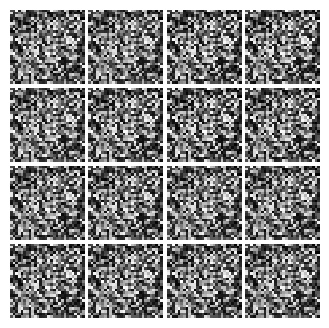

Epoch: 0, Iter: 60, D: 0.0146, G:0.6947


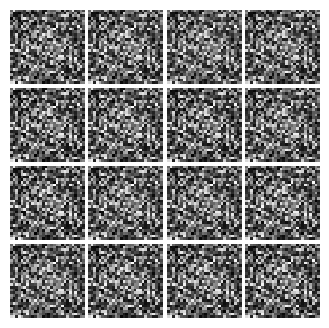

Epoch: 0, Iter: 80, D: 0.07134, G:0.9706


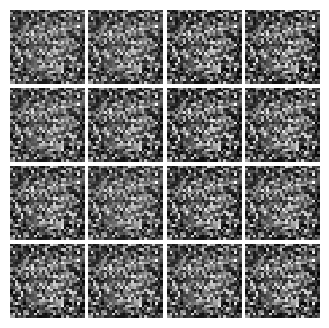

Epoch: 0, Iter: 100, D: 0.2867, G:0.825


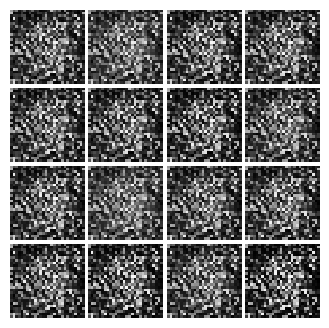

Epoch: 0, Iter: 120, D: 0.03573, G:0.8687


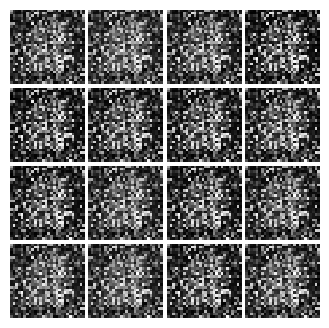

Epoch: 0, Iter: 140, D: 0.1874, G:0.4449


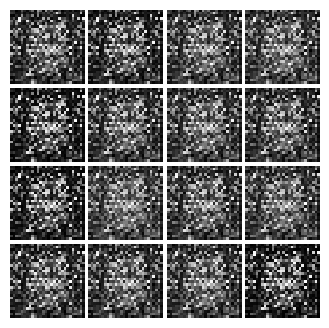

Epoch: 0, Iter: 160, D: 0.2275, G:0.5114


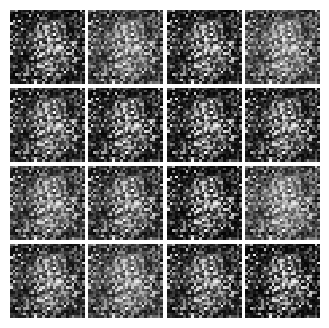

Epoch: 0, Iter: 180, D: 0.2279, G:0.9567


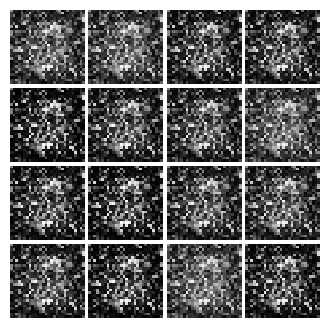

Epoch: 0, Iter: 200, D: 1.167, G:0.2377


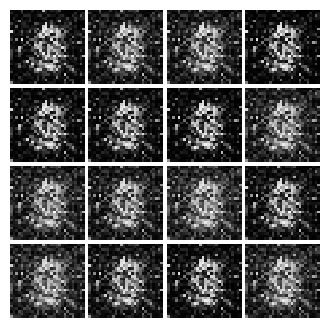

Epoch: 0, Iter: 220, D: 0.171, G:0.6959


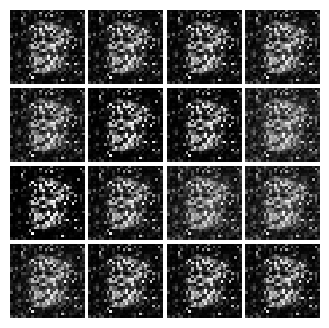

Epoch: 0, Iter: 240, D: 0.2266, G:0.1881


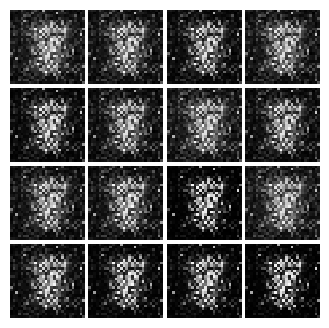

Epoch: 0, Iter: 260, D: 0.1769, G:0.3697


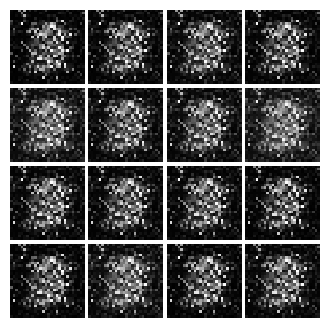

Epoch: 0, Iter: 280, D: 0.2342, G:0.225


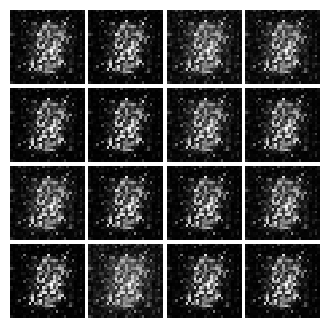

Epoch: 0, Iter: 300, D: 0.07387, G:0.5203


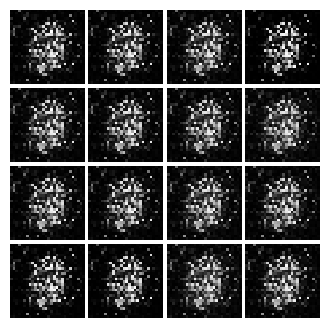

Epoch: 0, Iter: 320, D: 0.1101, G:0.4152


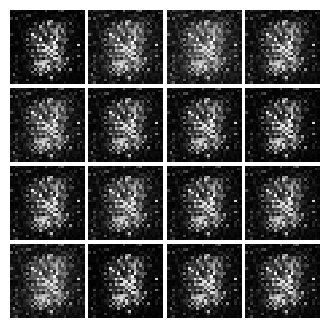

Epoch: 0, Iter: 340, D: 0.314, G:0.09525


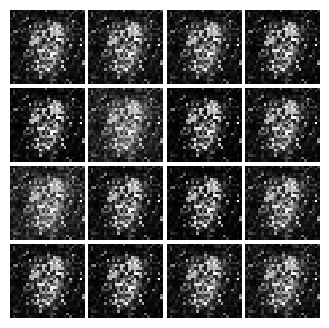

Epoch: 0, Iter: 360, D: 0.202, G:0.8301


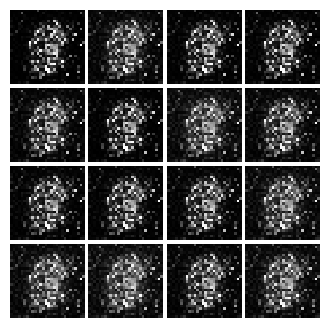

Epoch: 0, Iter: 380, D: 0.09642, G:0.514


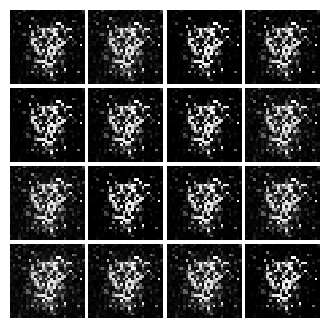

Epoch: 0, Iter: 400, D: 0.08347, G:0.5026


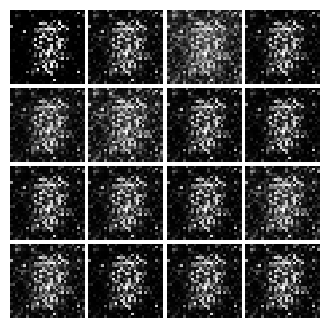

Epoch: 0, Iter: 420, D: 0.1268, G:0.3162


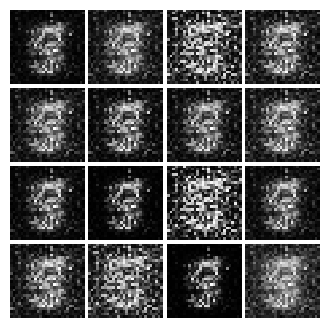

Epoch: 0, Iter: 440, D: 0.1517, G:0.6253


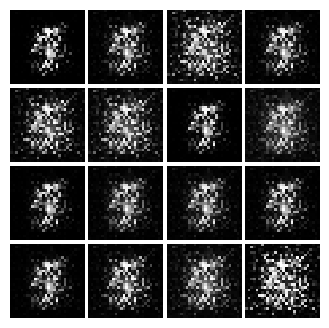

Epoch: 0, Iter: 460, D: 0.08519, G:0.4441


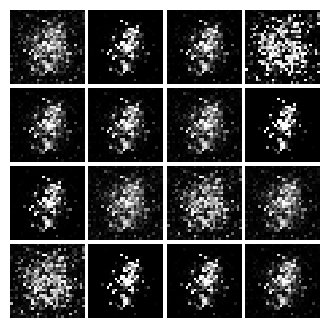

Epoch: 1, Iter: 480, D: 0.1448, G:0.4181


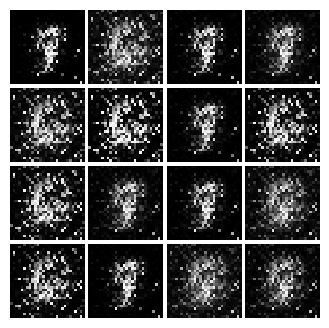

Epoch: 1, Iter: 500, D: 0.1208, G:0.4594


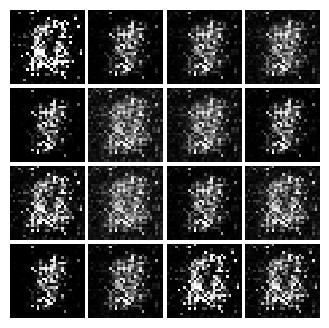

Epoch: 1, Iter: 520, D: 0.2384, G:0.3087


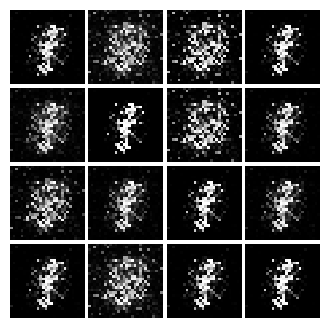

Epoch: 1, Iter: 540, D: 0.1919, G:0.2675


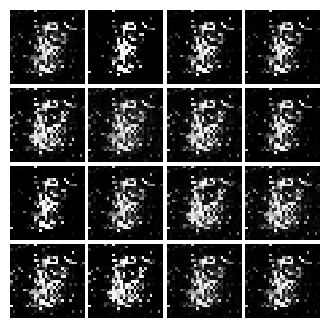

Epoch: 1, Iter: 560, D: 0.0747, G:0.4735


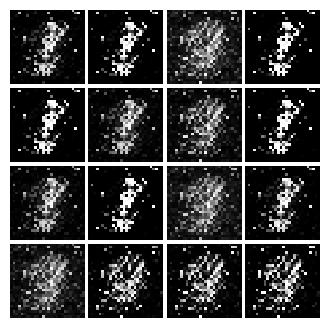

Epoch: 1, Iter: 580, D: 0.0993, G:0.3909


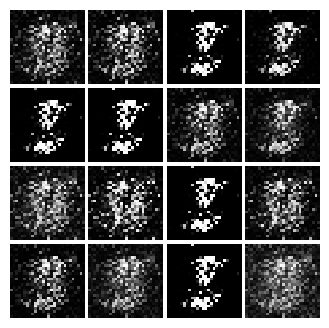

Epoch: 1, Iter: 600, D: 0.08984, G:0.4703


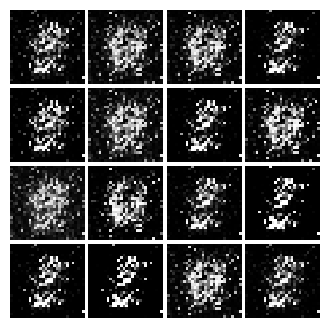

Epoch: 1, Iter: 620, D: 0.1562, G:0.604


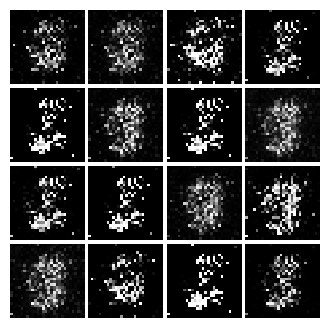

Epoch: 1, Iter: 640, D: 0.1114, G:0.7347


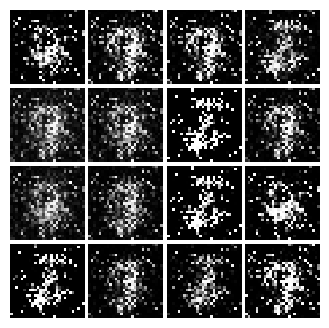

Epoch: 1, Iter: 660, D: 0.3596, G:0.03604


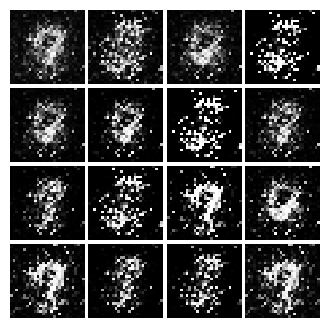

Epoch: 1, Iter: 680, D: 0.122, G:0.3951


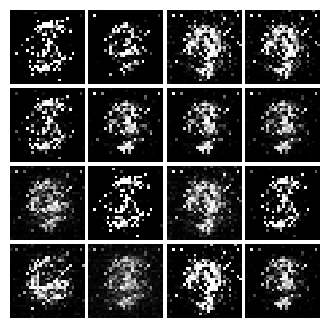

Epoch: 1, Iter: 700, D: 0.2116, G:0.3233


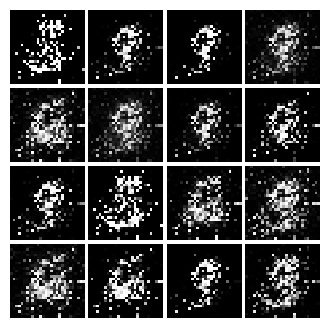

Epoch: 1, Iter: 720, D: 0.1202, G:0.2865


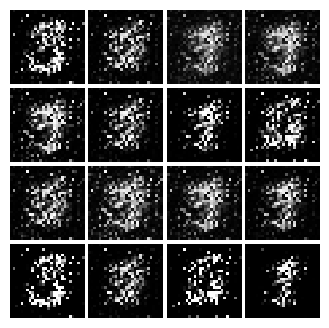

Epoch: 1, Iter: 740, D: 0.1192, G:0.4006


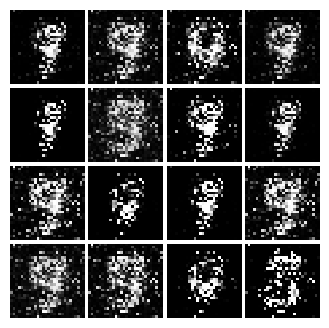

Epoch: 1, Iter: 760, D: 0.1625, G:0.3992


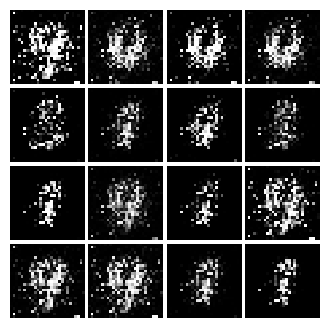

Epoch: 1, Iter: 780, D: 0.1216, G:0.3009


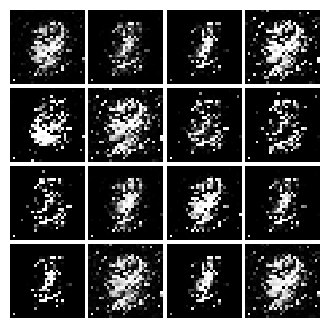

Epoch: 1, Iter: 800, D: 0.1506, G:0.3359


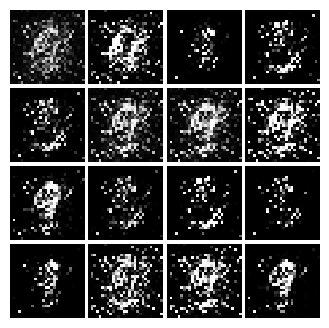

Epoch: 1, Iter: 820, D: 0.1579, G:0.3043


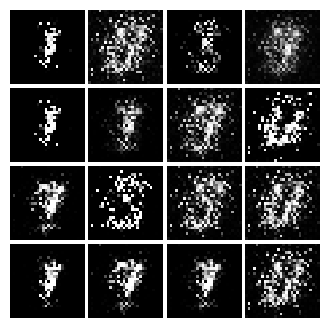

Epoch: 1, Iter: 840, D: 0.1224, G:0.2332


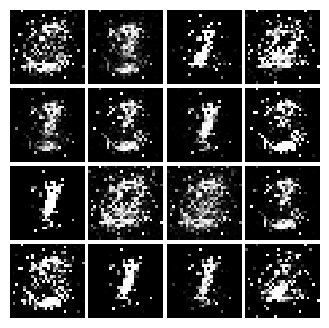

Epoch: 1, Iter: 860, D: 0.3231, G:0.4959


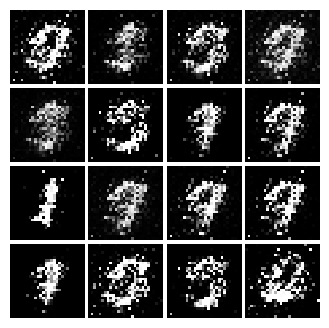

Epoch: 1, Iter: 880, D: 0.1563, G:0.2881


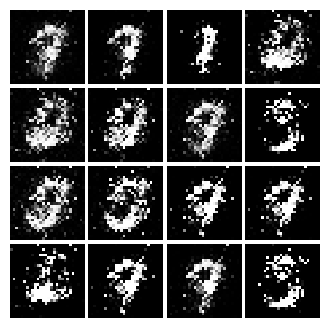

Epoch: 1, Iter: 900, D: 0.2271, G:0.3841


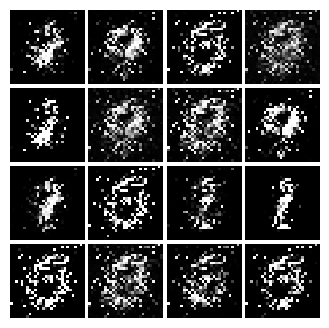

Epoch: 1, Iter: 920, D: 0.1295, G:0.3386


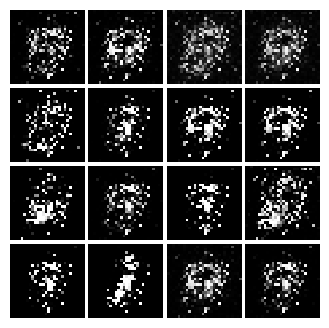

Epoch: 2, Iter: 940, D: 0.06672, G:0.4836


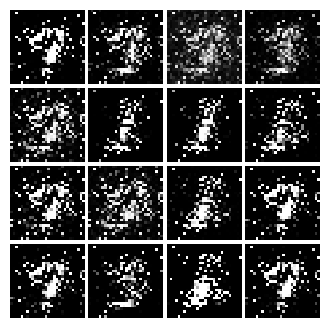

Epoch: 2, Iter: 960, D: 0.1668, G:0.346


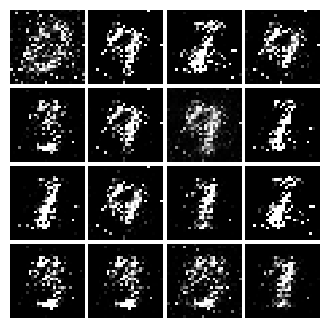

Epoch: 2, Iter: 980, D: 0.1507, G:0.4153


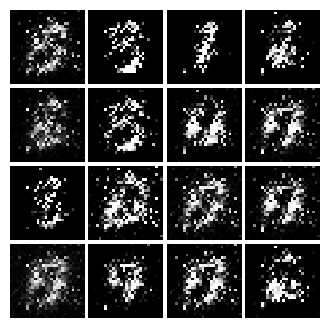

Epoch: 2, Iter: 1000, D: 0.1229, G:0.4961


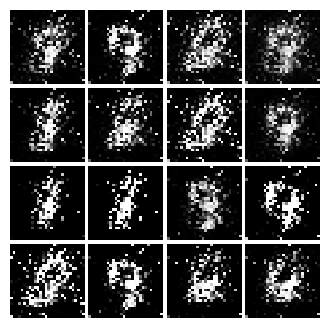

Epoch: 2, Iter: 1020, D: 0.1285, G:0.379


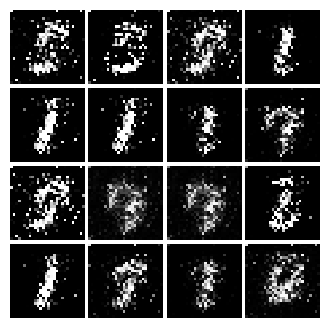

Epoch: 2, Iter: 1040, D: 0.1504, G:0.2764


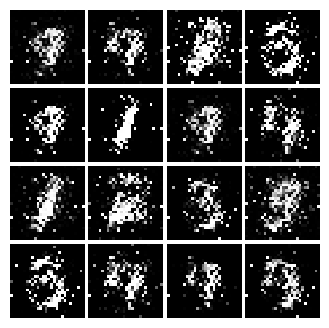

Epoch: 2, Iter: 1060, D: 0.1484, G:0.2777


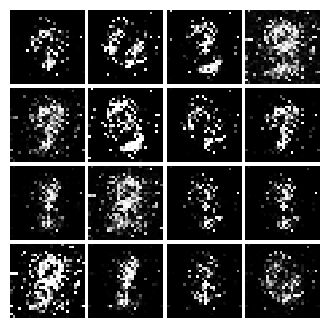

Epoch: 2, Iter: 1080, D: 0.1574, G:0.2571


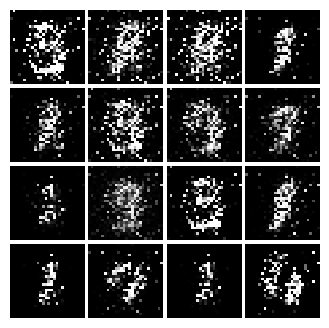

Epoch: 2, Iter: 1100, D: 0.1166, G:0.3957


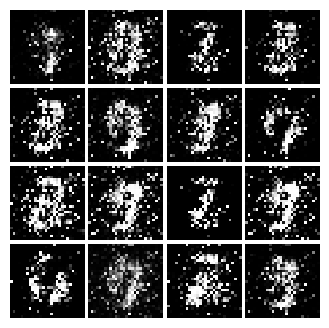

Epoch: 2, Iter: 1120, D: 0.1605, G:0.2747


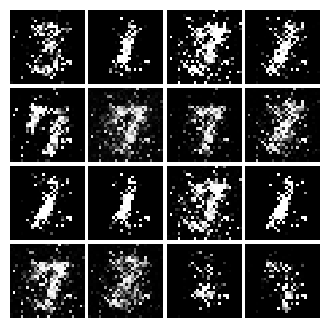

Epoch: 2, Iter: 1140, D: 0.1726, G:0.2772


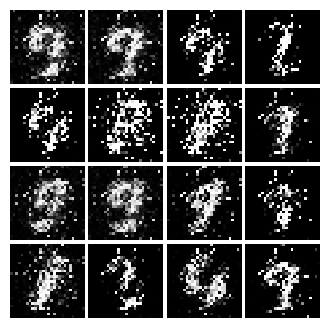

Epoch: 2, Iter: 1160, D: 0.1977, G:0.5837


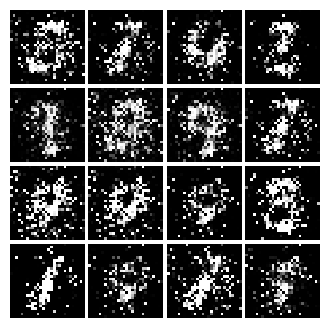

Epoch: 2, Iter: 1180, D: 0.125, G:0.3385


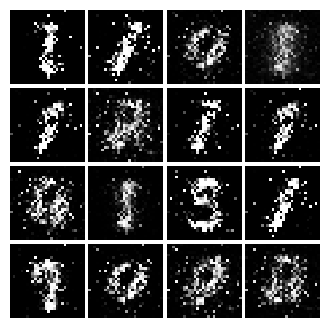

Epoch: 2, Iter: 1200, D: 0.165, G:0.3232


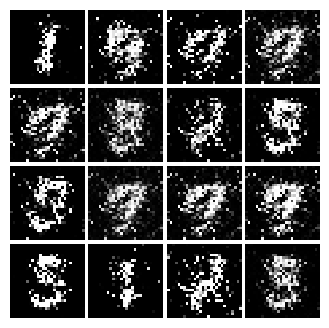

Epoch: 2, Iter: 1220, D: 0.1692, G:0.5474


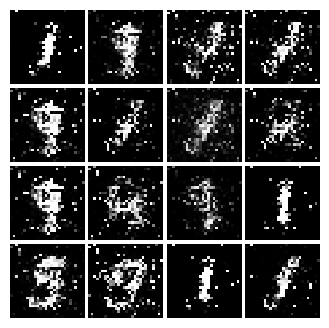

Epoch: 2, Iter: 1240, D: 0.1515, G:0.2683


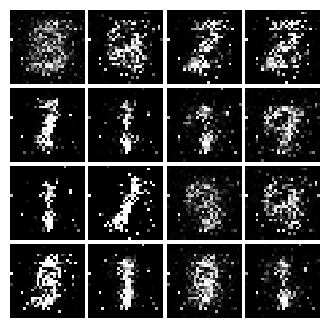

Epoch: 2, Iter: 1260, D: 0.2118, G:0.1915


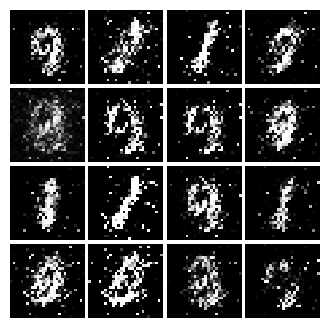

Epoch: 2, Iter: 1280, D: 0.1808, G:0.3629


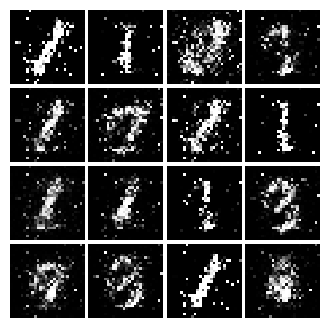

Epoch: 2, Iter: 1300, D: 0.229, G:0.1232


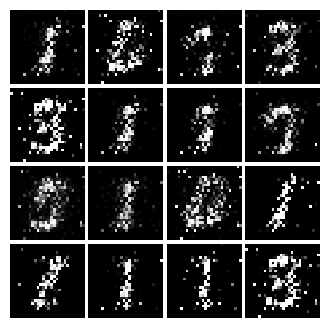

Epoch: 2, Iter: 1320, D: 0.2118, G:0.2172


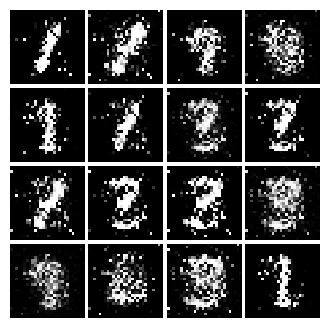

Epoch: 2, Iter: 1340, D: 0.1509, G:0.1928


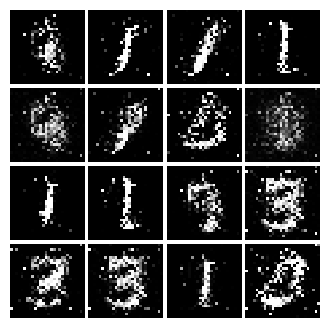

Epoch: 2, Iter: 1360, D: 0.1877, G:0.2313


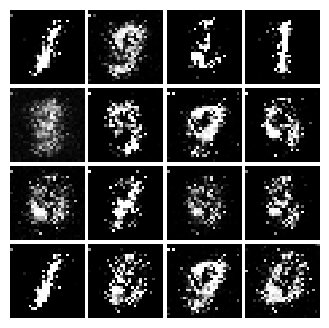

Epoch: 2, Iter: 1380, D: 0.1974, G:0.2213


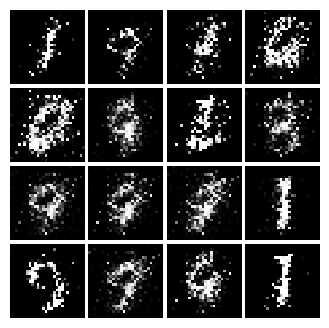

Epoch: 2, Iter: 1400, D: 0.241, G:0.3471


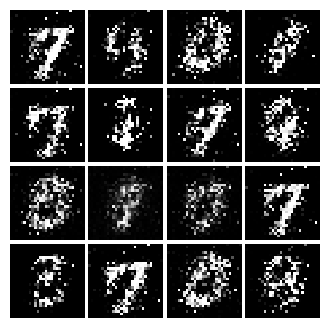

Epoch: 3, Iter: 1420, D: 0.1657, G:0.2722


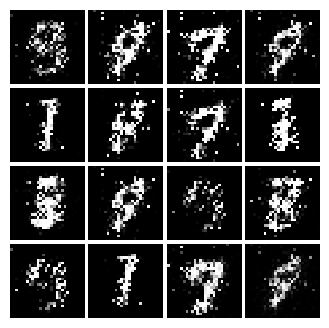

Epoch: 3, Iter: 1440, D: 0.1646, G:0.3128


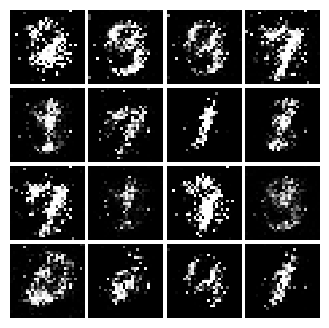

Epoch: 3, Iter: 1460, D: 0.2337, G:0.2487


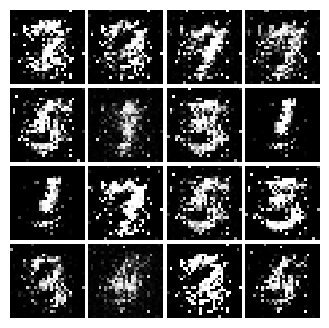

Epoch: 3, Iter: 1480, D: 0.1673, G:0.4414


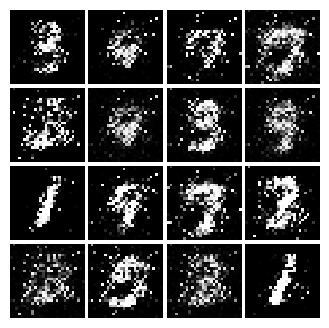

Epoch: 3, Iter: 1500, D: 0.2198, G:0.186


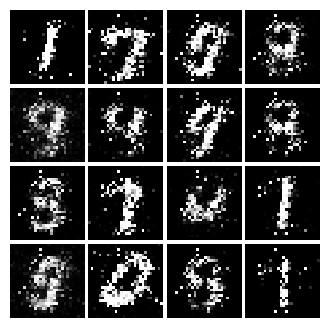

Epoch: 3, Iter: 1520, D: 0.1684, G:0.225


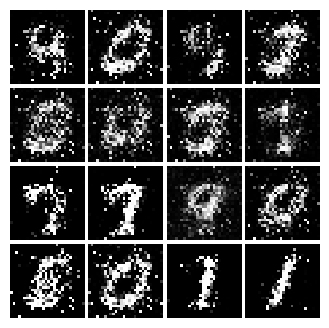

Epoch: 3, Iter: 1540, D: 0.1768, G:0.2741


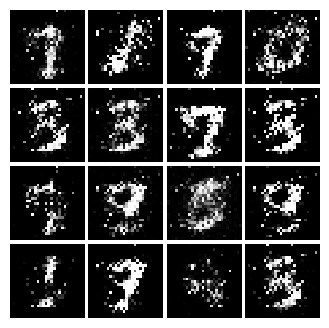

Epoch: 3, Iter: 1560, D: 0.1818, G:0.23


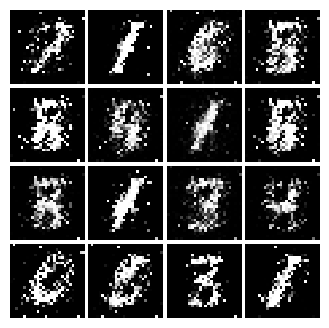

Epoch: 3, Iter: 1580, D: 0.1826, G:0.3521


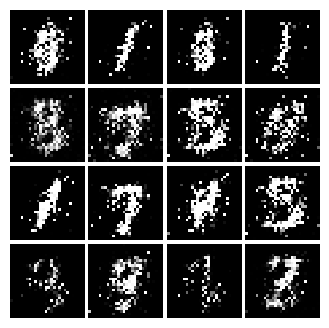

Epoch: 3, Iter: 1600, D: 0.207, G:0.2765


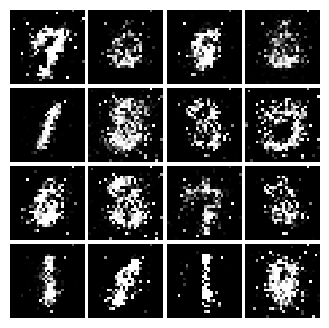

Epoch: 3, Iter: 1620, D: 0.1722, G:0.2534


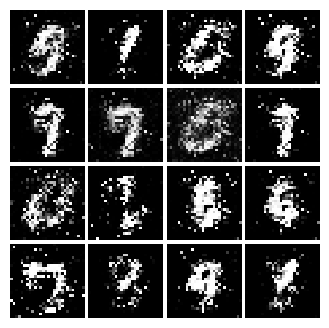

Epoch: 3, Iter: 1640, D: 0.2248, G:0.07099


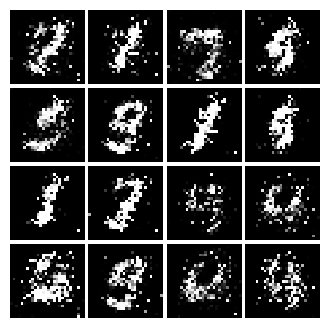

Epoch: 3, Iter: 1660, D: 0.1675, G:0.2491


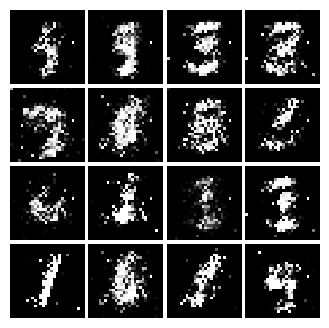

Epoch: 3, Iter: 1680, D: 0.1746, G:0.2546


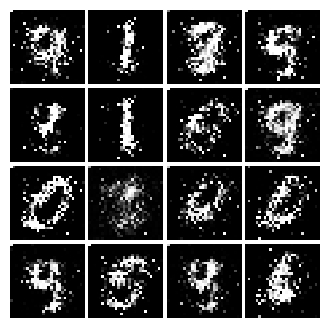

Epoch: 3, Iter: 1700, D: 0.2033, G:0.2007


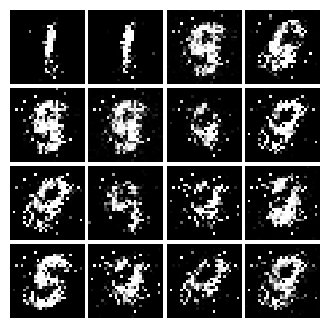

Epoch: 3, Iter: 1720, D: 0.1786, G:0.2651


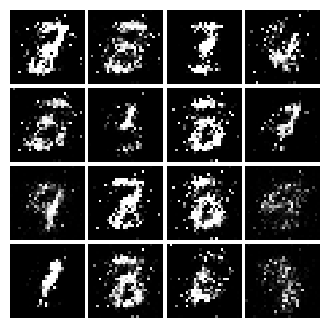

Epoch: 3, Iter: 1740, D: 0.2198, G:0.1821


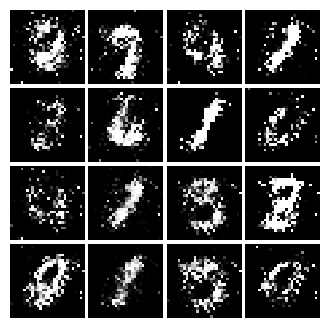

Epoch: 3, Iter: 1760, D: 0.5306, G:0.3011


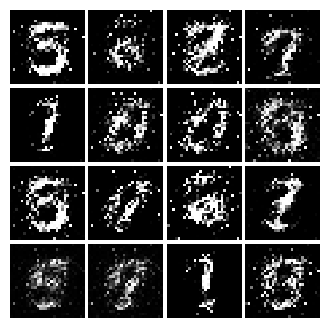

Epoch: 3, Iter: 1780, D: 0.1952, G:0.1899


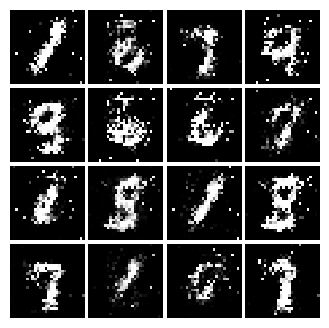

Epoch: 3, Iter: 1800, D: 0.22, G:0.1911


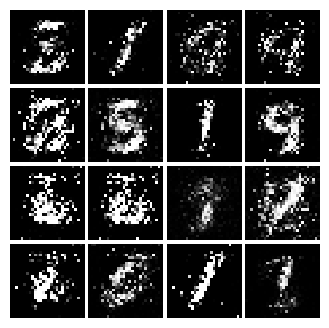

Epoch: 3, Iter: 1820, D: 0.1939, G:0.1987


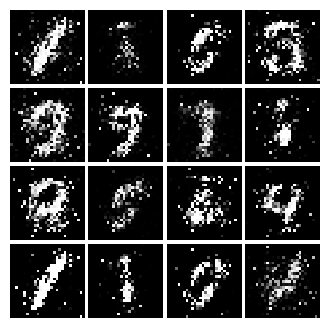

Epoch: 3, Iter: 1840, D: 0.2199, G:0.1769


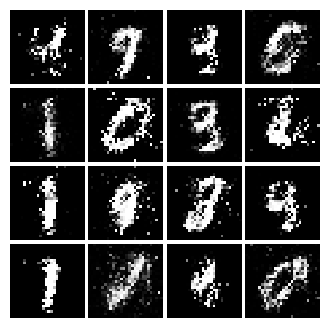

Epoch: 3, Iter: 1860, D: 0.2256, G:0.2055


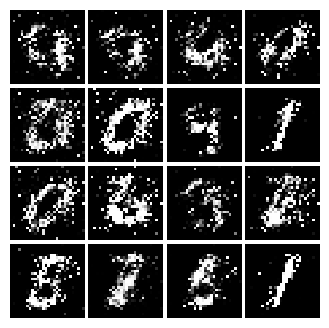

Epoch: 4, Iter: 1880, D: 0.2039, G:0.2053


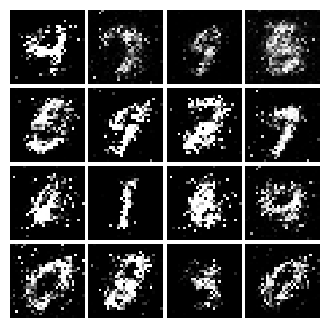

Epoch: 4, Iter: 1900, D: 0.1916, G:0.21


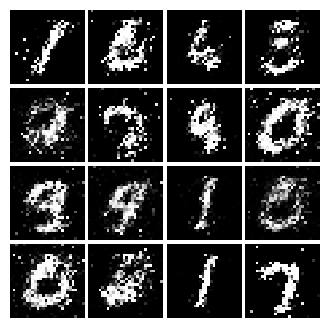

Epoch: 4, Iter: 1920, D: 0.1953, G:0.213


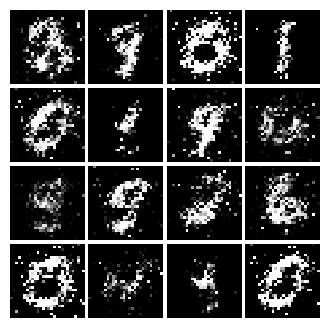

Epoch: 4, Iter: 1940, D: 0.2038, G:0.2039


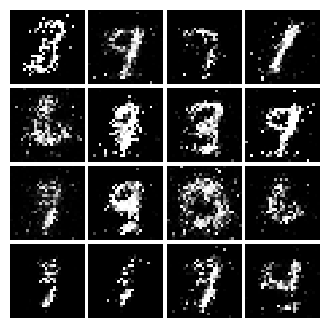

Epoch: 4, Iter: 1960, D: 0.2112, G:0.1915


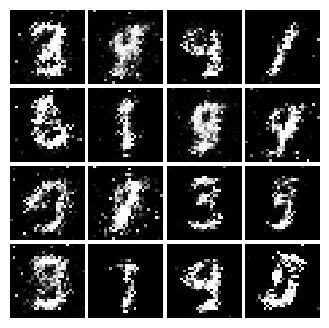

Epoch: 4, Iter: 1980, D: 0.2027, G:0.2093


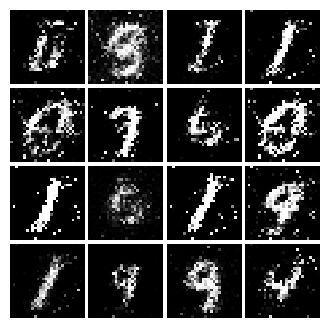

Epoch: 4, Iter: 2000, D: 0.2191, G:0.1872


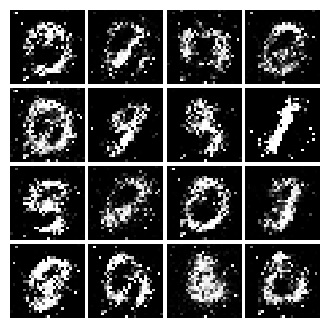

Epoch: 4, Iter: 2020, D: 0.2247, G:0.2168


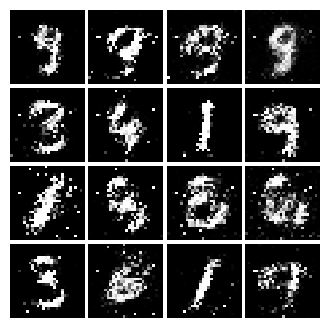

Epoch: 4, Iter: 2040, D: 0.2296, G:0.2119


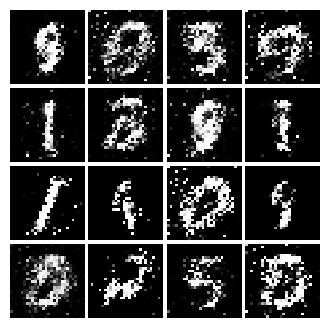

Epoch: 4, Iter: 2060, D: 0.2209, G:0.165


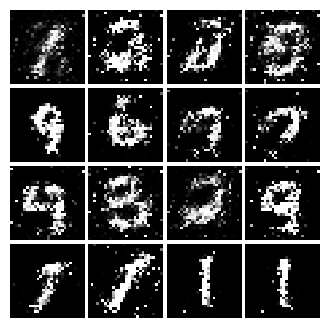

Epoch: 4, Iter: 2080, D: 0.2041, G:0.2306


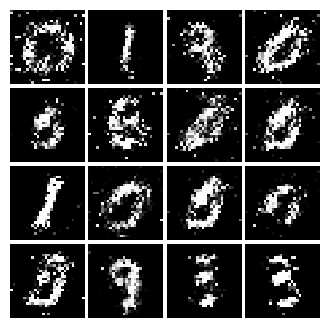

Epoch: 4, Iter: 2100, D: 0.2362, G:0.2116


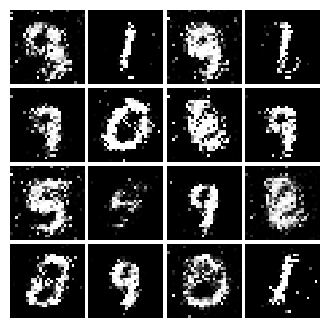

Epoch: 4, Iter: 2120, D: 0.2188, G:0.1605


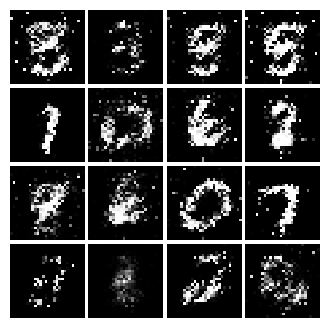

Epoch: 4, Iter: 2140, D: 0.2139, G:0.2009


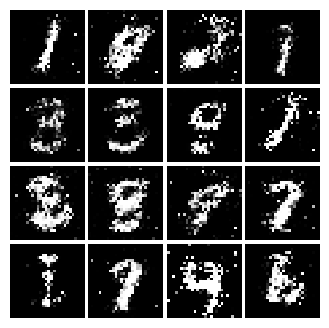

Epoch: 4, Iter: 2160, D: 0.2382, G:0.2101


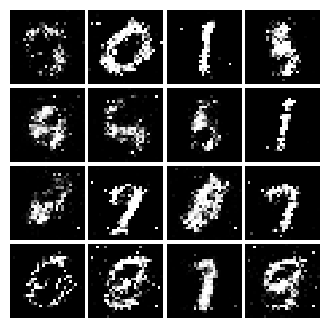

Epoch: 4, Iter: 2180, D: 0.2186, G:0.1851


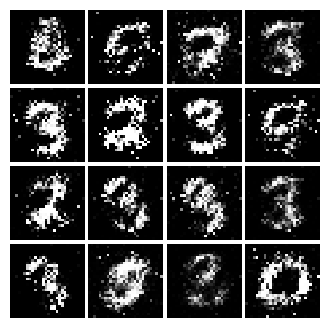

Epoch: 4, Iter: 2200, D: 0.2253, G:0.1802


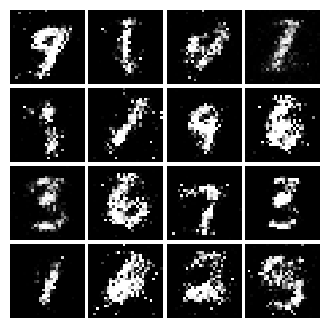

Epoch: 4, Iter: 2220, D: 0.2122, G:0.2292


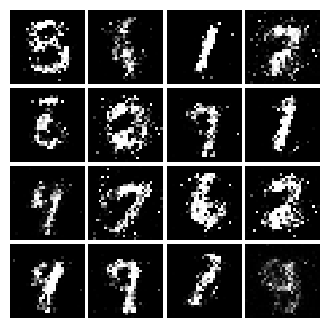

Epoch: 4, Iter: 2240, D: 0.2279, G:0.1441


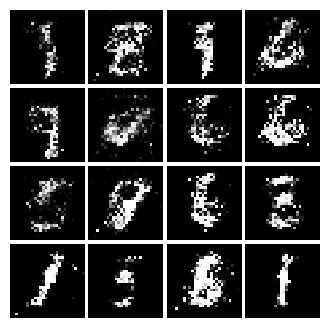

Epoch: 4, Iter: 2260, D: 0.2253, G:0.1883


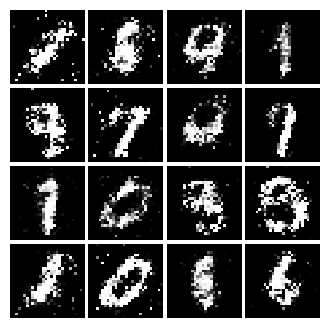

Epoch: 4, Iter: 2280, D: 0.2201, G:0.1627


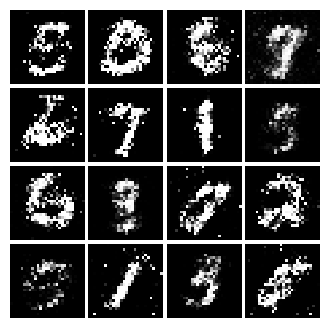

Epoch: 4, Iter: 2300, D: 0.2444, G:0.1589


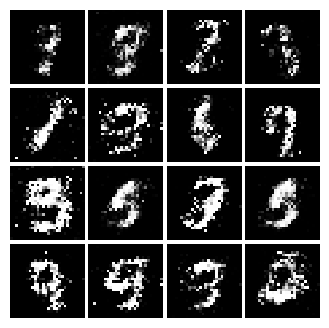

Epoch: 4, Iter: 2320, D: 0.204, G:0.1738


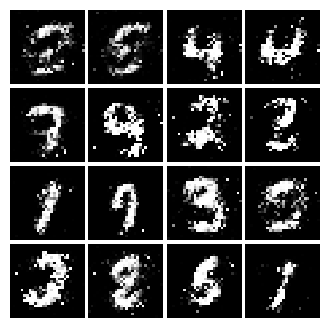

Epoch: 4, Iter: 2340, D: 0.2126, G:0.203


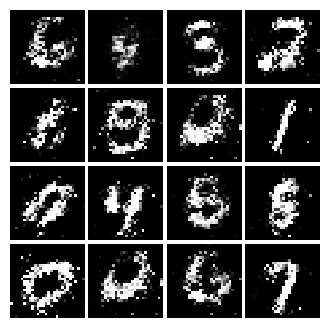

Epoch: 5, Iter: 2360, D: 0.2386, G:0.1675


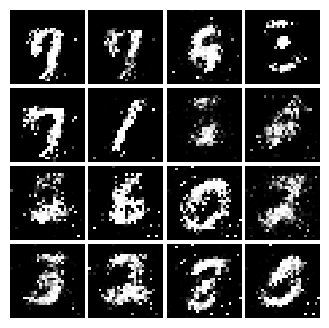

Epoch: 5, Iter: 2380, D: 0.2122, G:0.1848


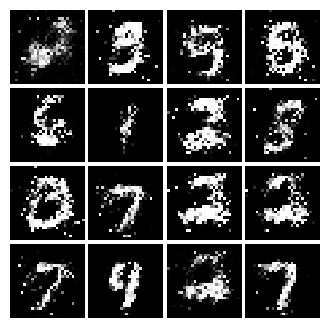

Epoch: 5, Iter: 2400, D: 0.2175, G:0.188


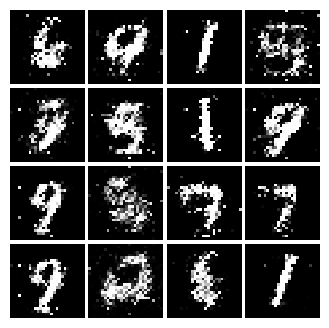

Epoch: 5, Iter: 2420, D: 0.1863, G:0.1844


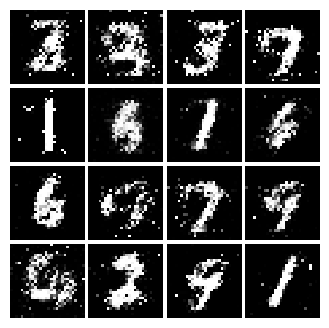

Epoch: 5, Iter: 2440, D: 0.2321, G:0.1139


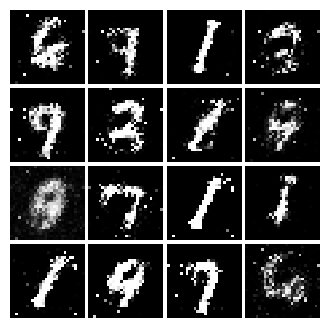

Epoch: 5, Iter: 2460, D: 0.2103, G:0.1782


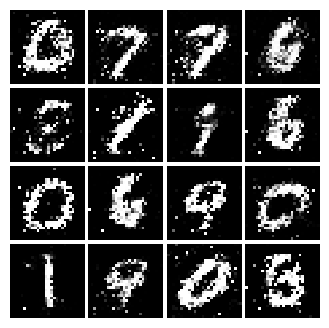

Epoch: 5, Iter: 2480, D: 0.2087, G:0.1683


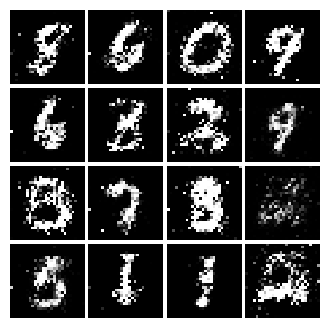

Epoch: 5, Iter: 2500, D: 0.1947, G:0.1741


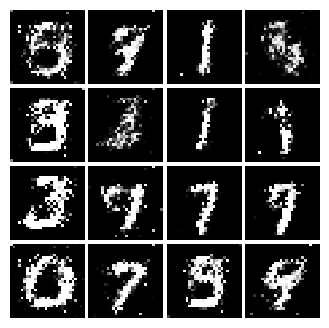

Epoch: 5, Iter: 2520, D: 0.2314, G:0.1578


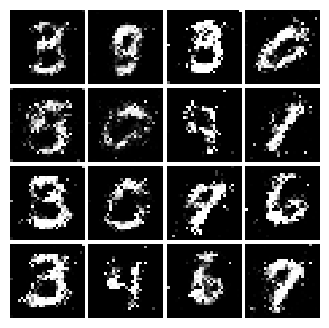

Epoch: 5, Iter: 2540, D: 0.236, G:0.1929


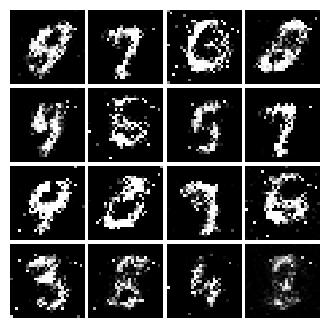

Epoch: 5, Iter: 2560, D: 0.2236, G:0.1696


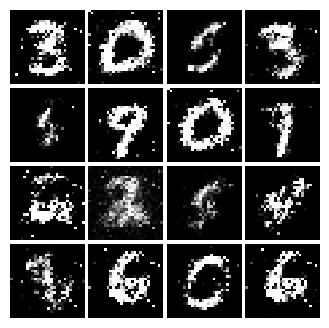

Epoch: 5, Iter: 2580, D: 0.2269, G:0.1834


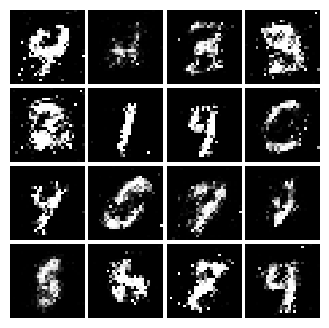

Epoch: 5, Iter: 2600, D: 0.2281, G:0.1429


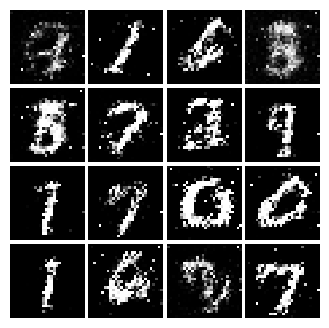

Epoch: 5, Iter: 2620, D: 0.2198, G:0.1896


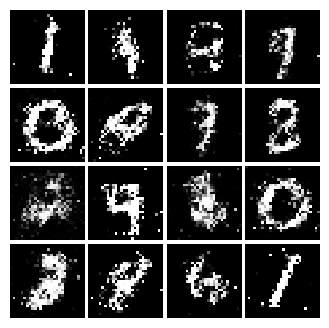

Epoch: 5, Iter: 2640, D: 0.2201, G:0.2492


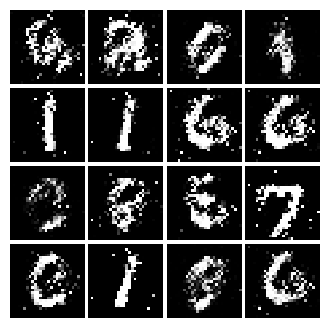

Epoch: 5, Iter: 2660, D: 0.2216, G:0.1829


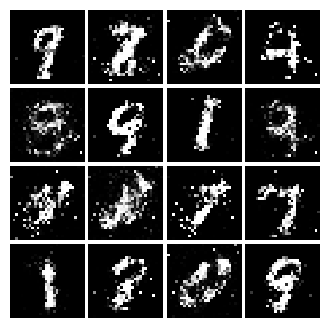

Epoch: 5, Iter: 2680, D: 0.2614, G:0.1755


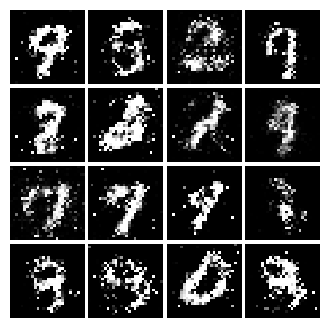

Epoch: 5, Iter: 2700, D: 0.2245, G:0.2155


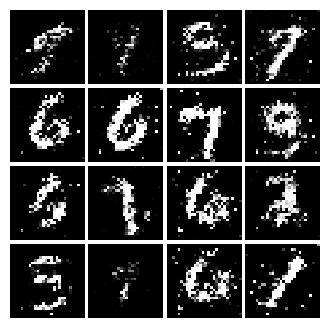

Epoch: 5, Iter: 2720, D: 0.2152, G:0.1645


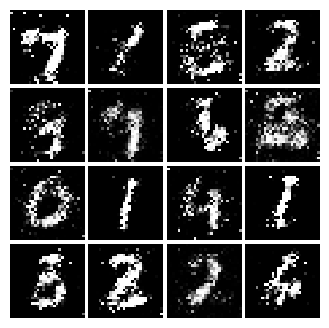

Epoch: 5, Iter: 2740, D: 0.2157, G:0.1696


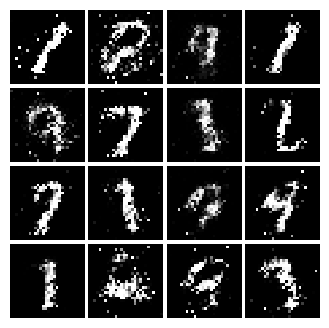

Epoch: 5, Iter: 2760, D: 0.2548, G:0.1739


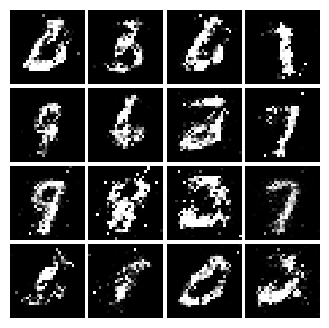

Epoch: 5, Iter: 2780, D: 0.2293, G:0.1729


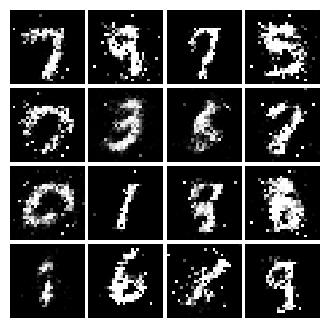

Epoch: 5, Iter: 2800, D: 0.2085, G:0.1792


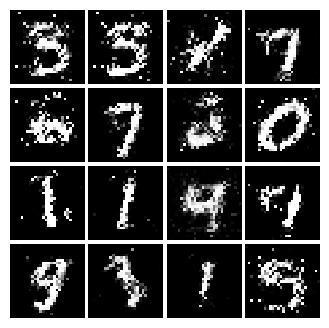

Epoch: 6, Iter: 2820, D: 0.23, G:0.1692


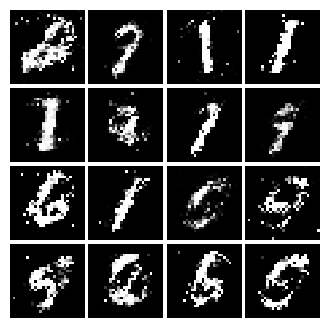

Epoch: 6, Iter: 2840, D: 0.2277, G:0.1953


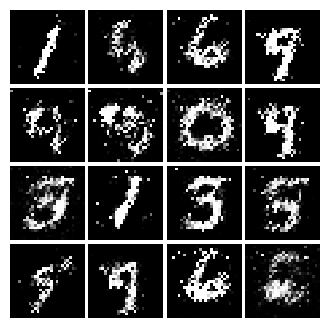

Epoch: 6, Iter: 2860, D: 0.2043, G:0.1687


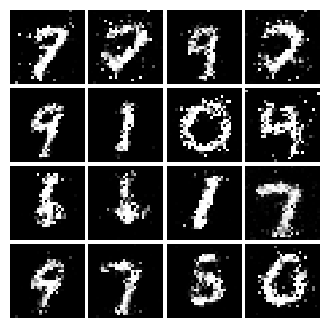

Epoch: 6, Iter: 2880, D: 0.2021, G:0.2268


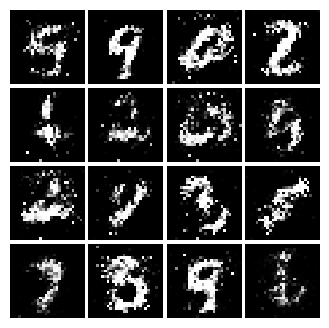

Epoch: 6, Iter: 2900, D: 0.2165, G:0.1663


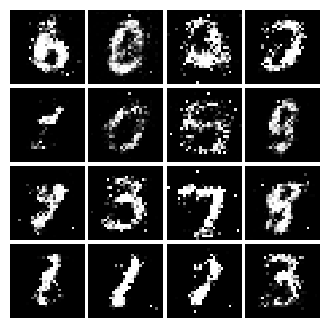

Epoch: 6, Iter: 2920, D: 0.2475, G:0.1642


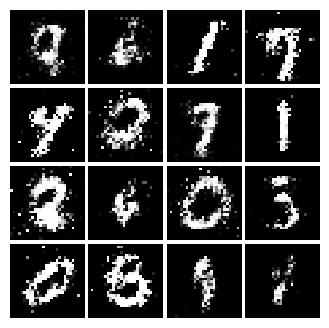

Epoch: 6, Iter: 2940, D: 0.2268, G:0.1834


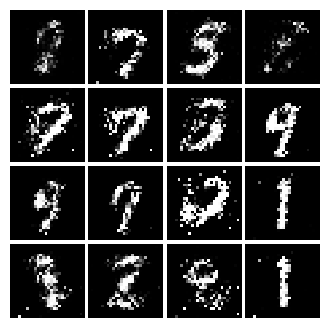

Epoch: 6, Iter: 2960, D: 0.2181, G:0.1619


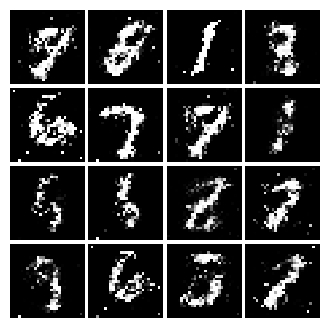

Epoch: 6, Iter: 2980, D: 0.2404, G:0.205


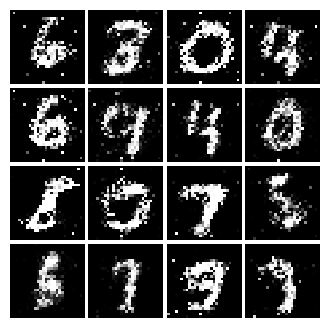

Epoch: 6, Iter: 3000, D: 0.252, G:0.2092


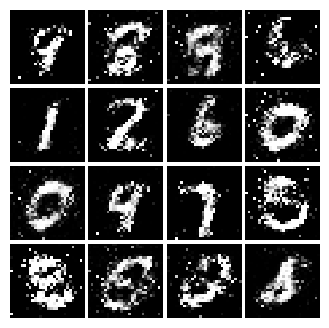

Epoch: 6, Iter: 3020, D: 0.2211, G:0.1927


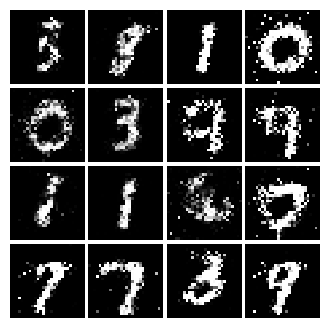

Epoch: 6, Iter: 3040, D: 0.23, G:0.1935


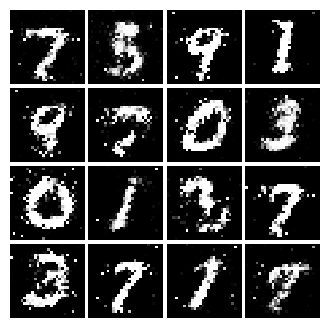

Epoch: 6, Iter: 3060, D: 0.2393, G:0.1671


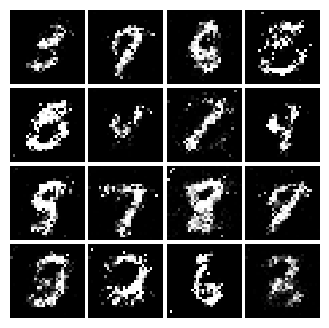

Epoch: 6, Iter: 3080, D: 0.2176, G:0.1694


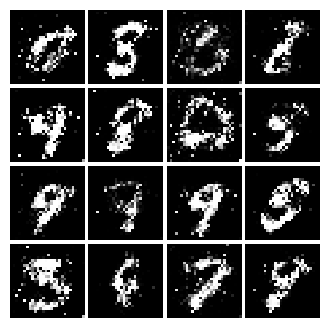

Epoch: 6, Iter: 3100, D: 0.2271, G:0.1497


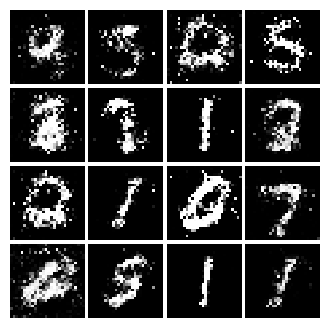

Epoch: 6, Iter: 3120, D: 0.2473, G:0.1635


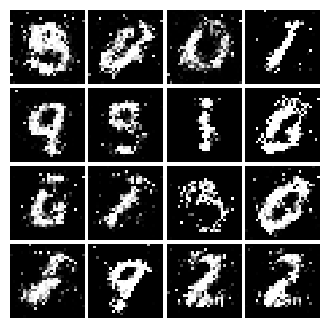

Epoch: 6, Iter: 3140, D: 0.2326, G:0.1716


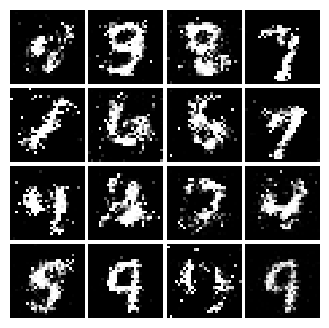

Epoch: 6, Iter: 3160, D: 0.2222, G:0.1773


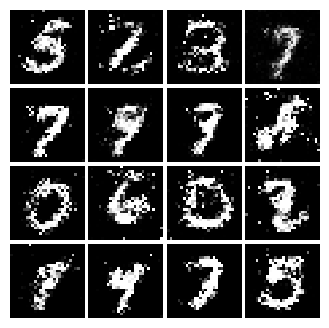

Epoch: 6, Iter: 3180, D: 0.2213, G:0.1775


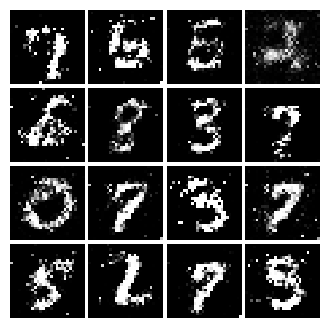

Epoch: 6, Iter: 3200, D: 0.2225, G:0.2029


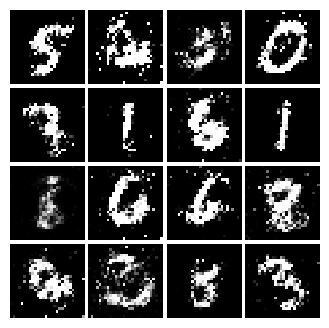

Epoch: 6, Iter: 3220, D: 0.2197, G:0.1529


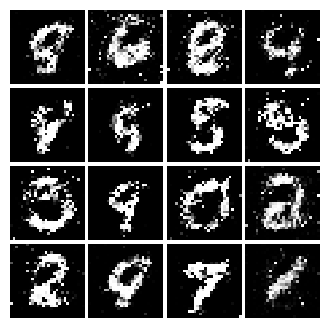

Epoch: 6, Iter: 3240, D: 0.2132, G:0.1638


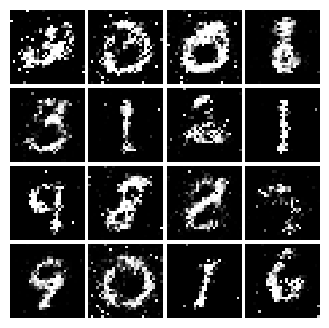

Epoch: 6, Iter: 3260, D: 0.2347, G:0.1575


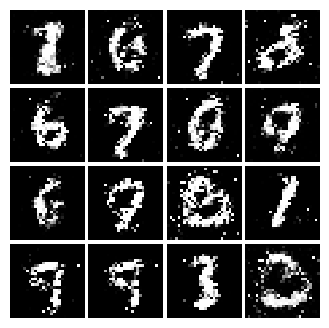

Epoch: 6, Iter: 3280, D: 0.238, G:0.1693


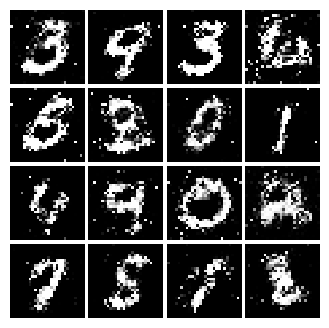

Epoch: 7, Iter: 3300, D: 0.2071, G:0.1664


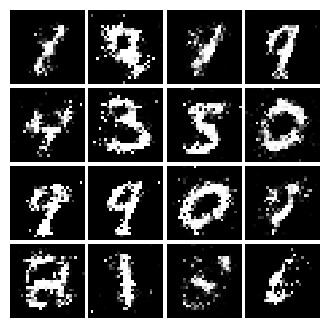

Epoch: 7, Iter: 3320, D: 0.2156, G:0.1754


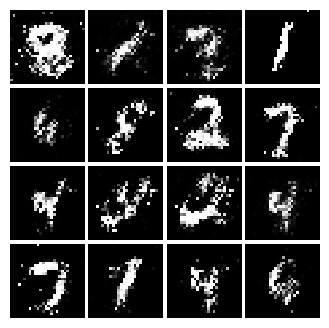

Epoch: 7, Iter: 3340, D: 0.1941, G:0.1946


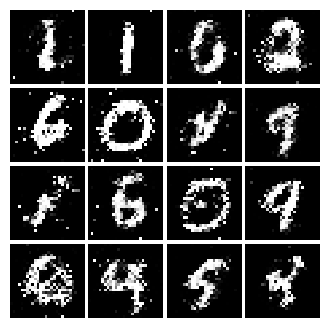

Epoch: 7, Iter: 3360, D: 0.274, G:0.1824


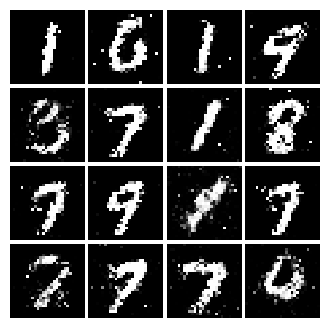

Epoch: 7, Iter: 3380, D: 0.2468, G:0.1592


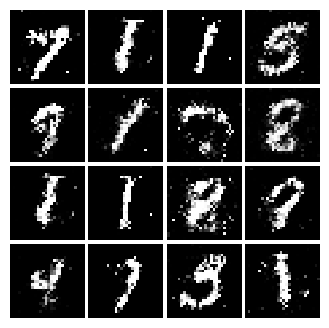

Epoch: 7, Iter: 3400, D: 0.238, G:0.1472


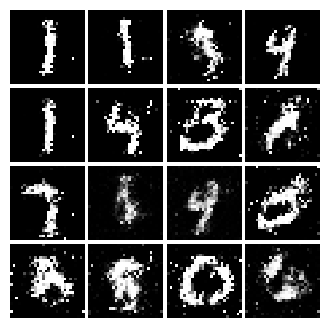

Epoch: 7, Iter: 3420, D: 0.2129, G:0.1588


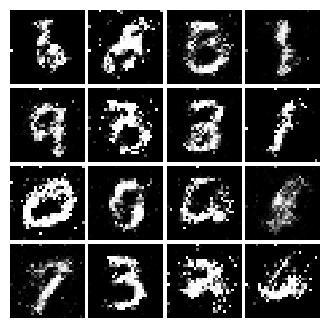

Epoch: 7, Iter: 3440, D: 0.2565, G:0.1516


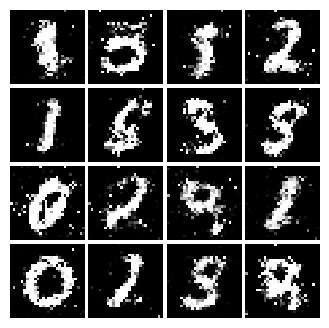

Epoch: 7, Iter: 3460, D: 0.2253, G:0.1836


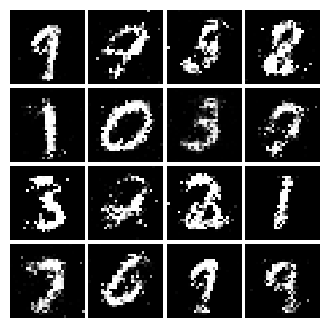

Epoch: 7, Iter: 3480, D: 0.2232, G:0.173


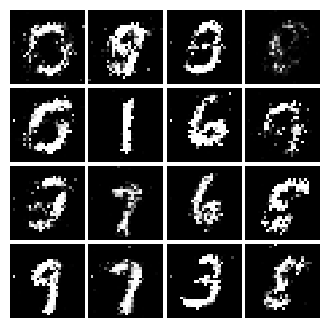

Epoch: 7, Iter: 3500, D: 0.232, G:0.1751


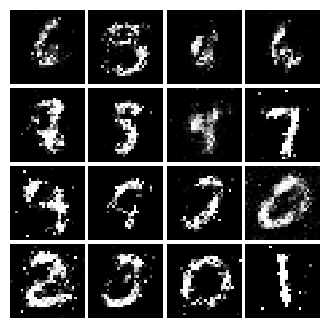

Epoch: 7, Iter: 3520, D: 0.2657, G:0.1356


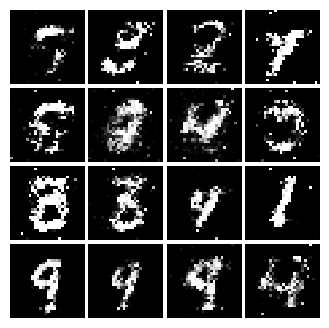

Epoch: 7, Iter: 3540, D: 0.2223, G:0.1617


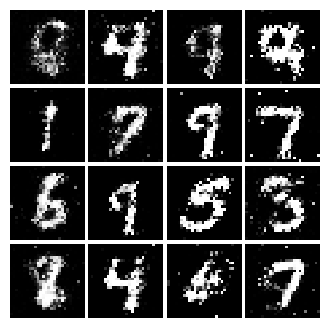

Epoch: 7, Iter: 3560, D: 0.2098, G:0.17


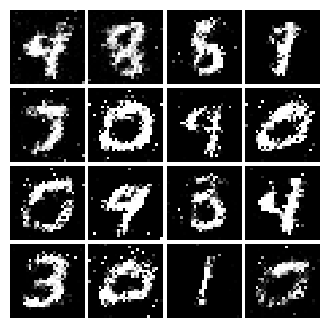

Epoch: 7, Iter: 3580, D: 0.2247, G:0.1635


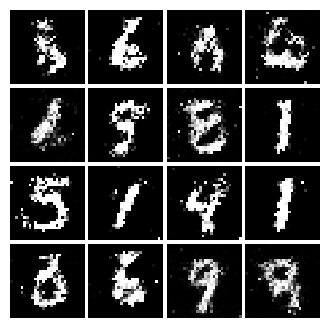

Epoch: 7, Iter: 3600, D: 0.2271, G:0.1632


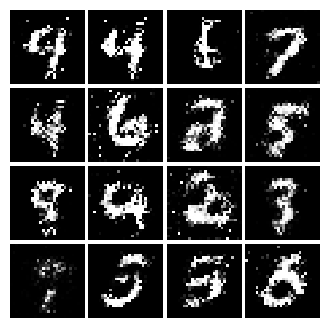

Epoch: 7, Iter: 3620, D: 0.2542, G:0.1606


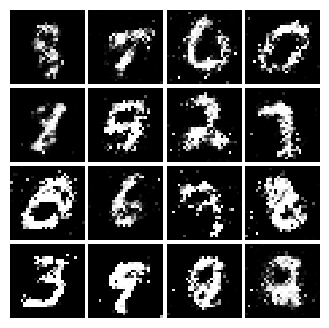

Epoch: 7, Iter: 3640, D: 0.2322, G:0.1348


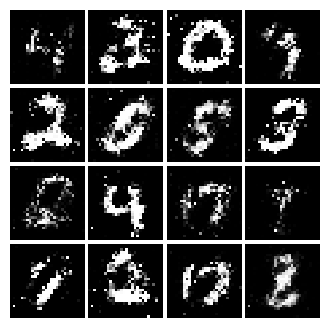

Epoch: 7, Iter: 3660, D: 0.2219, G:0.1987


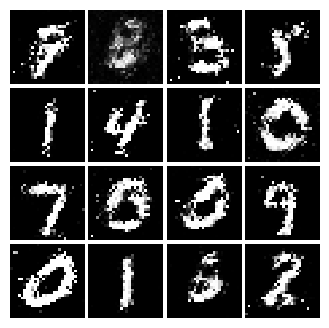

Epoch: 7, Iter: 3680, D: 0.2199, G:0.1627


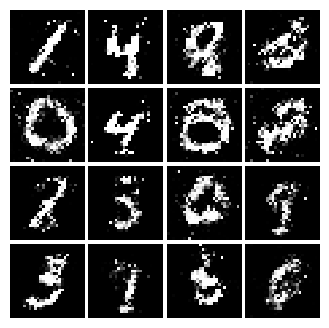

Epoch: 7, Iter: 3700, D: 0.2313, G:0.1702


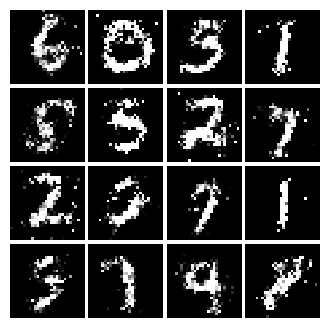

Epoch: 7, Iter: 3720, D: 0.2231, G:0.153


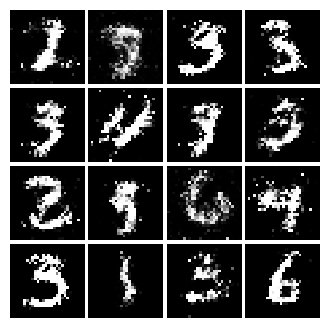

Epoch: 7, Iter: 3740, D: 0.2407, G:0.1299


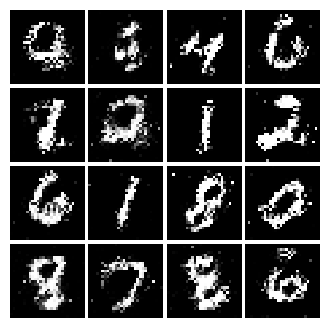

Epoch: 8, Iter: 3760, D: 0.2309, G:0.1966


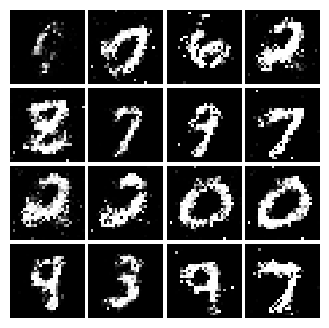

Epoch: 8, Iter: 3780, D: 0.2313, G:0.1593


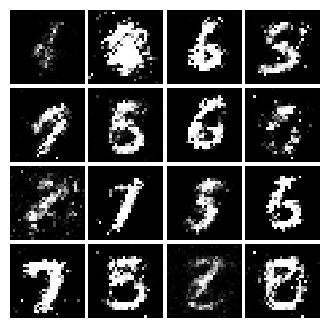

Epoch: 8, Iter: 3800, D: 0.2335, G:0.1819


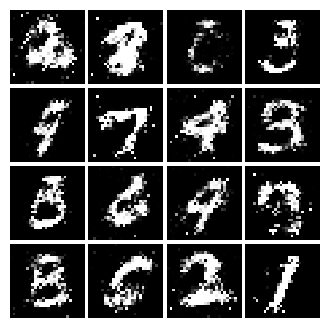

Epoch: 8, Iter: 3820, D: 0.2486, G:0.1513


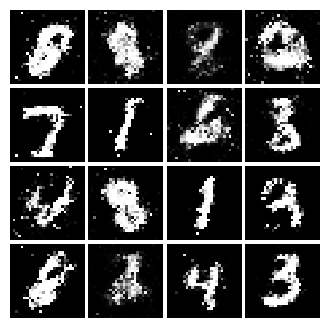

Epoch: 8, Iter: 3840, D: 0.2338, G:0.1567


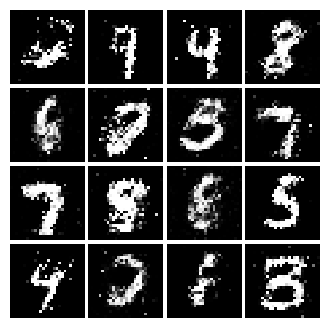

Epoch: 8, Iter: 3860, D: 0.2231, G:0.1604


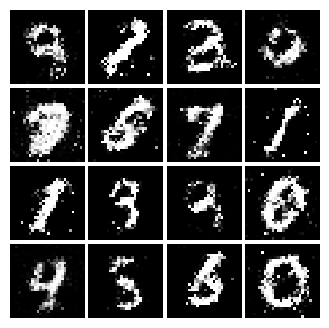

Epoch: 8, Iter: 3880, D: 0.2366, G:0.1529


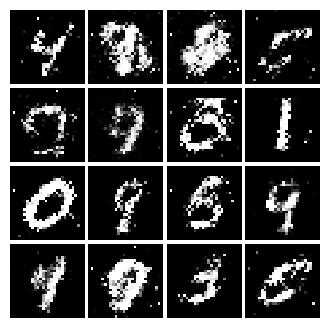

Epoch: 8, Iter: 3900, D: 0.2262, G:0.1523


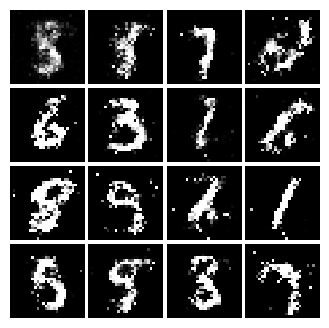

Epoch: 8, Iter: 3920, D: 0.2377, G:0.1751


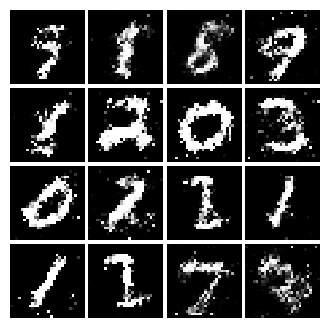

Epoch: 8, Iter: 3940, D: 0.2205, G:0.1569


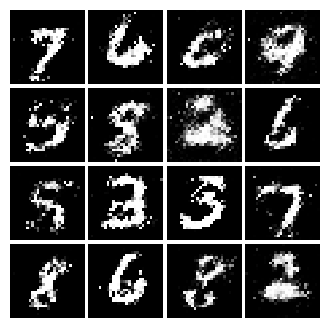

Epoch: 8, Iter: 3960, D: 0.2415, G:0.174


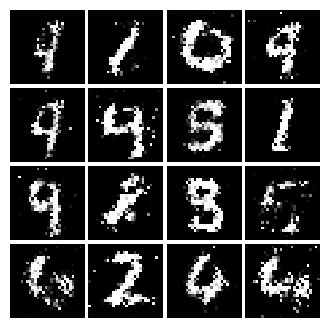

Epoch: 8, Iter: 3980, D: 0.2409, G:0.1933


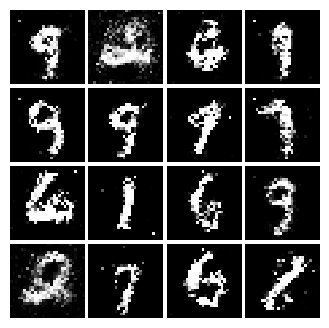

Epoch: 8, Iter: 4000, D: 0.2093, G:0.172


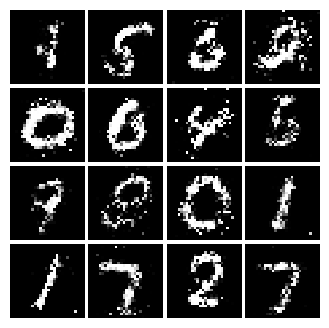

Epoch: 8, Iter: 4020, D: 0.2665, G:0.07172


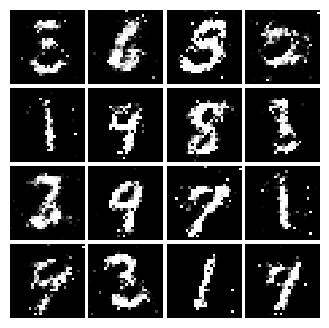

Epoch: 8, Iter: 4040, D: 0.2266, G:0.1546


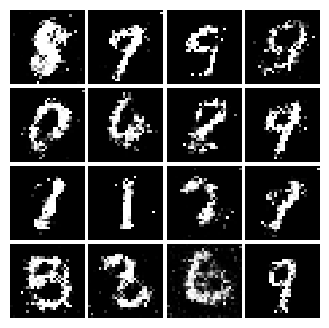

Epoch: 8, Iter: 4060, D: 0.2205, G:0.1551


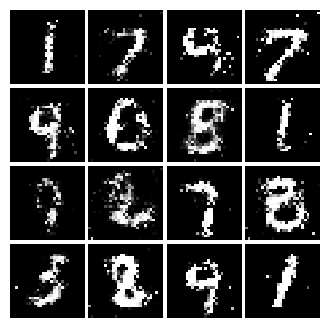

Epoch: 8, Iter: 4080, D: 0.2695, G:0.1618


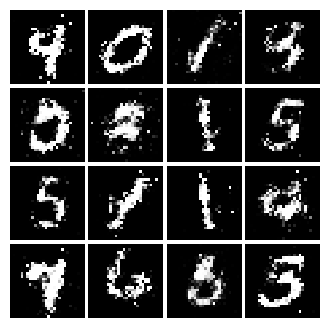

Epoch: 8, Iter: 4100, D: 0.2303, G:0.1594


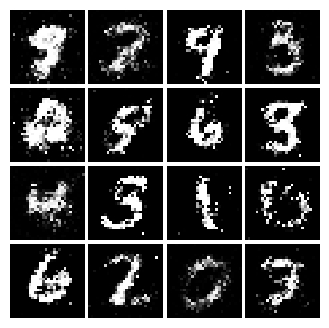

Epoch: 8, Iter: 4120, D: 0.2312, G:0.135


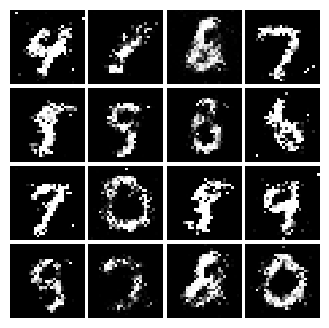

Epoch: 8, Iter: 4140, D: 0.2115, G:0.1541


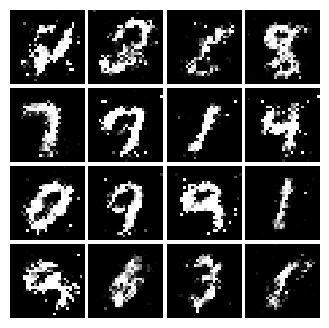

Epoch: 8, Iter: 4160, D: 0.2421, G:0.1577


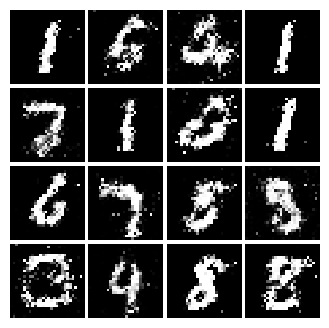

Epoch: 8, Iter: 4180, D: 0.239, G:0.1637


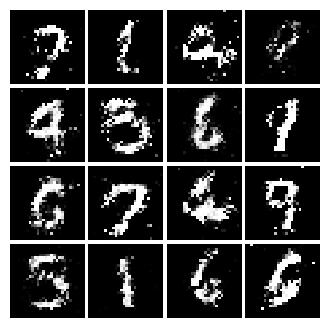

Epoch: 8, Iter: 4200, D: 0.2263, G:0.1799


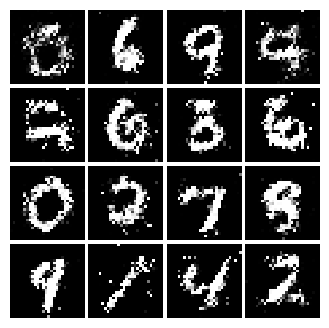

Epoch: 8, Iter: 4220, D: 0.2135, G:0.1619


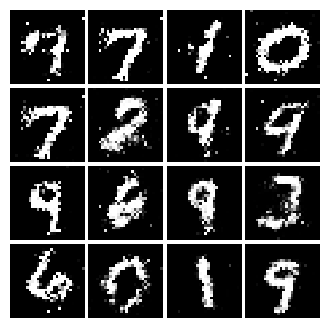

Epoch: 9, Iter: 4240, D: 0.2164, G:0.1658


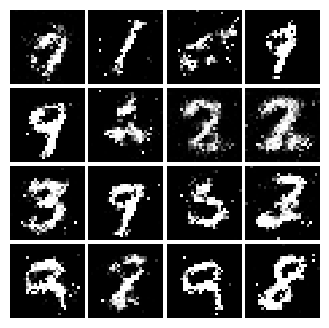

Epoch: 9, Iter: 4260, D: 0.2303, G:0.1465


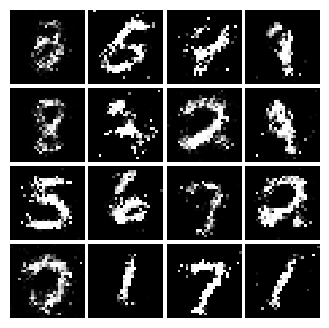

Epoch: 9, Iter: 4280, D: 0.2711, G:0.1599


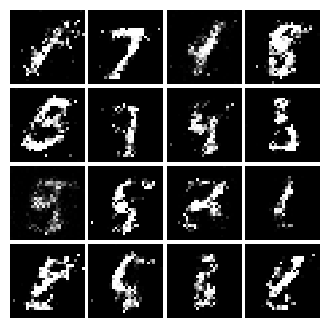

Epoch: 9, Iter: 4300, D: 0.2338, G:0.1752


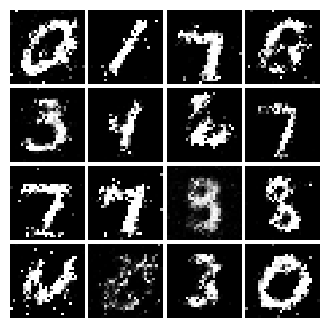

Epoch: 9, Iter: 4320, D: 0.2183, G:0.1635


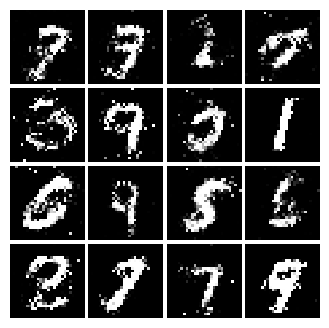

Epoch: 9, Iter: 4340, D: 0.2351, G:0.2149


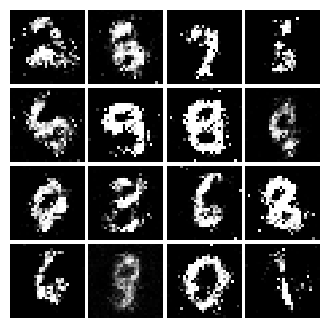

Epoch: 9, Iter: 4360, D: 0.2503, G:0.1587


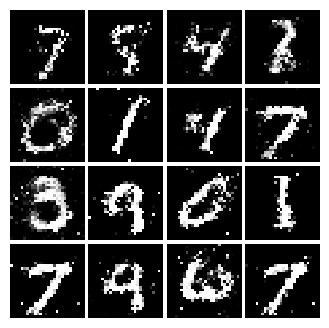

Epoch: 9, Iter: 4380, D: 0.2309, G:0.1717


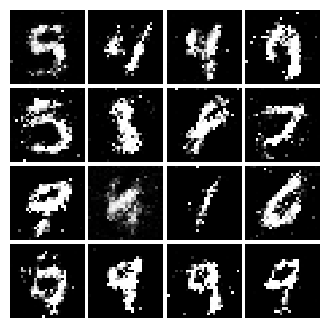

Epoch: 9, Iter: 4400, D: 0.1992, G:0.2139


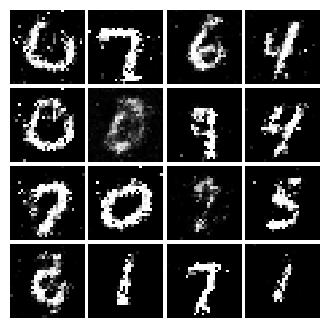

Epoch: 9, Iter: 4420, D: 0.229, G:0.1813


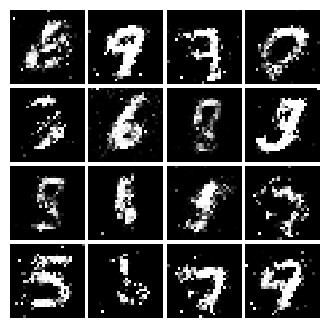

Epoch: 9, Iter: 4440, D: 0.231, G:0.1451


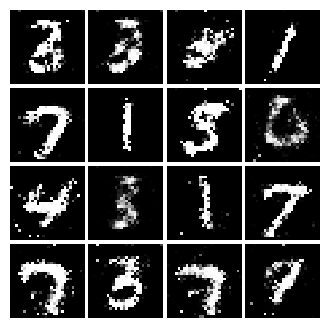

Epoch: 9, Iter: 4460, D: 0.234, G:0.1445


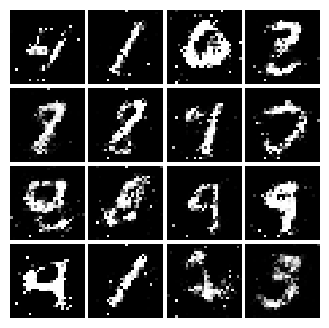

Epoch: 9, Iter: 4480, D: 0.2367, G:0.1616


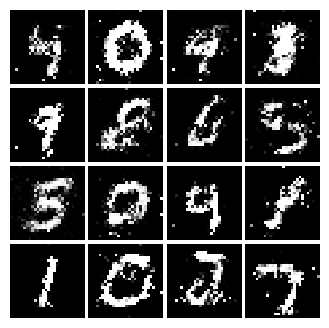

Epoch: 9, Iter: 4500, D: 0.2358, G:0.1643


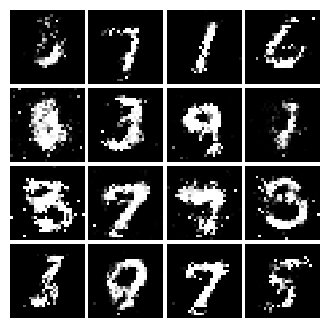

Epoch: 9, Iter: 4520, D: 0.241, G:0.1454


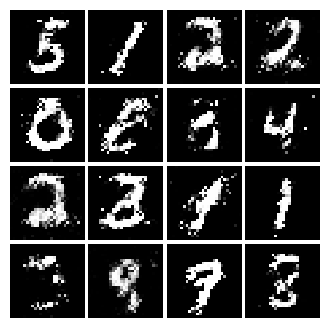

Epoch: 9, Iter: 4540, D: 0.2603, G:0.1645


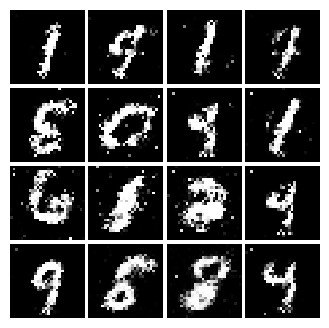

Epoch: 9, Iter: 4560, D: 0.2358, G:0.1567


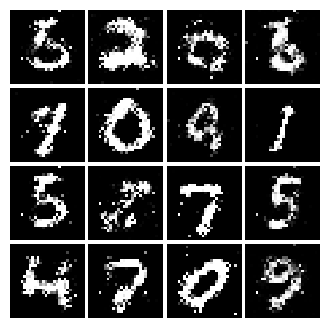

Epoch: 9, Iter: 4580, D: 0.2269, G:0.151


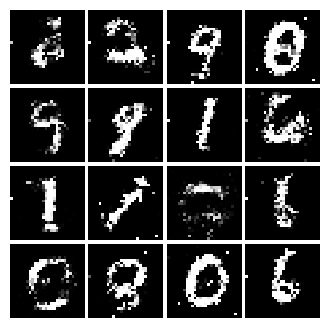

Epoch: 9, Iter: 4600, D: 0.2238, G:0.1599


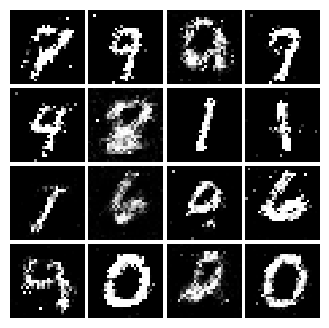

Epoch: 9, Iter: 4620, D: 0.2303, G:0.1903


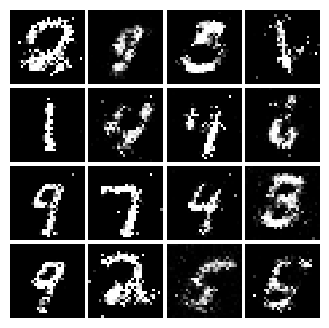

Epoch: 9, Iter: 4640, D: 0.2325, G:0.1602


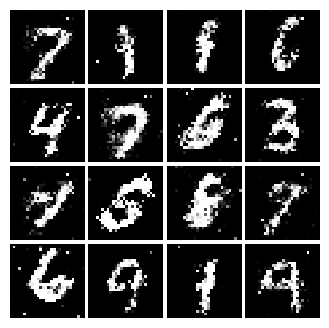

Epoch: 9, Iter: 4660, D: 0.2295, G:0.1514


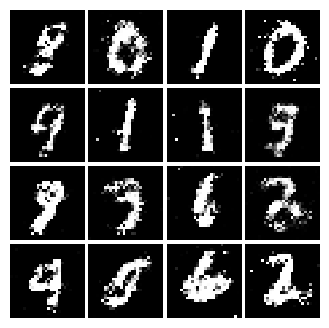

Epoch: 9, Iter: 4680, D: 0.2476, G:0.1527


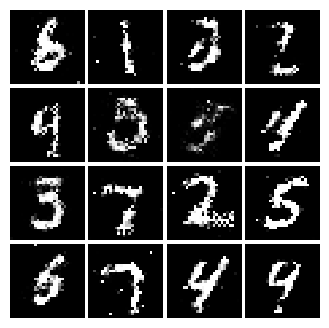

Final images


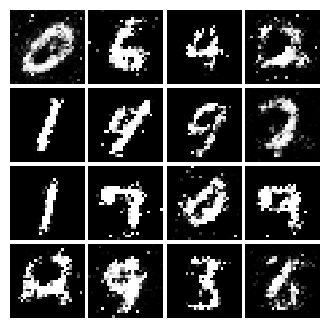

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)